# EDA
The main purpose of our EDA is to investigate and decide on the following:
* Feature selection,
* Missing data imputation.

## Imports

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import missingno as msno
from scipy.stats import chi2_contingency, f_oneway, jarque_bera, probplot
from matplotlib.gridspec import GridSpec
from sklearn.preprocessing import PowerTransformer
from data_cleaning_utils import clean_data

## Loading the data

In [2]:
df = pd.read_csv("swiggy.csv")
df.head()

,ID,Delivery_person_ID,Delivery_person_Age,Delivery_person_Ratings,Restaurant_latitude,Restaurant_longitude,Delivery_location_latitude,Delivery_location_longitude,Order_Date,Time_Orderd,Time_Order_picked,Weatherconditions,Road_traffic_density,Vehicle_condition,Type_of_order,Type_of_vehicle,multiple_deliveries,Festival,City,Time_taken(min)
0,0x4607,INDORES13DEL02,37,4.9,22.745049,75.892471,22.765049,75.912471,19-03-2022,11:30:00,11:45:00,conditions Sunny,High,2,Snack,motorcycle,0,No,Urban,(min) 24
1,0xb379,BANGRES18DEL02,34,4.5,12.913041,77.683237,13.043041,77.813237,25-03-2022,19:45:00,19:50:00,conditions Stormy,Jam,2,Snack,scooter,1,No,Metropolitian,(min) 33
2,0x5d6d,BANGRES19DEL01,23,4.4,12.914264,77.678400,12.924264,77.688400,19-03-2022,08:30:00,08:45:00,conditions Sandstorms,Low,0,Drinks,motorcycle,1,No,Urban,(min) 26
3,0x7a6a,COIMBRES13DEL02,38,4.7,11.003669,76.976494,11.053669,77.026494,05-04-2022,18:00:00,18:10:00,conditions Sunny,Medium,0,Buffet,motorcycle,1,No,Metropolitian,(min) 21
4,0x70a2,CHENRES12DEL01,32,4.6,12.972793,80.249982,13.012793,80.289982,26-03-2022,13:30:00,13:45:00,conditions Cloudy,High,1,Snack,scooter,1,No,Metropolitian,(min) 30


## Cleaning the data

In [3]:
df = clean_data(df=df)
df.head()

,rider_id,age,ratings,restaurant_latitude,restaurant_longitude,delivery_latitude,delivery_longitude,order_date,weather,traffic,...,city_name,distance,distance_type,order_day,order_month,order_day_of_week,order_day_is_weekend,pickup_time_minutes,order_time_hour,order_time_of_day
0,INDORES13DEL02,37.0,4.9,22.745049,75.892471,22.765049,75.912471,2022-03-19,sunny,high,...,INDO,3.025149,short,19,3,saturday,1,15.0,11.0,morning
1,BANGRES18DEL02,34.0,4.5,12.913041,77.683237,13.043041,77.813237,2022-03-25,stormy,jam,...,BANG,20.183530,very_long,25,3,friday,0,5.0,19.0,evening
2,BANGRES19DEL01,23.0,4.4,12.914264,77.678400,12.924264,77.688400,2022-03-19,sandstorms,low,...,BANG,1.552758,short,19,3,saturday,1,15.0,8.0,morning
3,COIMBRES13DEL02,38.0,4.7,11.003669,76.976494,11.053669,77.026494,2022-04-05,sunny,medium,...,COIMB,7.790401,medium,5,4,tuesday,0,10.0,18.0,evening
4,CHENRES12DEL01,32.0,4.6,12.972793,80.249982,13.012793,80.289982,2022-03-26,cloudy,high,...,CHEN,6.210138,medium,26,3,saturday,1,15.0,13.0,afternoon


## Preliminary analysis

### Checking the number of missing values

In [4]:
df.isnull().sum()

rider_id                   0
age                     1854
ratings                 1908
restaurant_latitude     3630
restaurant_longitude    3630
delivery_latitude       3630
delivery_longitude      3630
order_date                 0
weather                  525
traffic                  510
vehicle_condition          0
type_of_order              0
type_of_vehicle            0
multiple_deliveries      993
festival                 228
city_type               1198
time_taken                 0
city_name                  0
distance                3630
distance_type           3630
order_day                  0
order_month                0
order_day_of_week          0
order_day_is_weekend       0
pickup_time_minutes     1640
order_time_hour         1640
order_time_of_day       1640
dtype: int64

In [5]:
df.isnull().sum().sum()

33916

In [6]:
missing_rows = df.isnull().any(axis=1).sum()

print(f"There are {missing_rows} rows with missing values, which accounts for roughly {(missing_rows/df.shape[0])*100:.2f}% of the data.")

There are 7438 rows with missing values, which accounts for roughly 16.35% of the data.


The percentage of missing values in the cleaned data has increased because we have converted many invalid values in the raw data to `np.nan`, e.g., the invalid location columns.

### Checking for duplicate rows

In [7]:
df.duplicated().sum()

0

There are no duplicate rows.

### Checking the data types of all the columns

In [8]:
df.dtypes

rider_id                        object
age                            float64
ratings                        float64
restaurant_latitude            float64
restaurant_longitude           float64
delivery_latitude              float64
delivery_longitude             float64
order_date              datetime64[ns]
weather                         object
traffic                         object
vehicle_condition                int64
type_of_order                   object
type_of_vehicle                 object
multiple_deliveries            float64
festival                        object
city_type                       object
time_taken                       int32
city_name                       object
distance                       float64
distance_type                 category
order_day                        int32
order_month                      int32
order_day_of_week               object
order_day_is_weekend             int32
pickup_time_minutes            float64
order_time_hour          

### Numerical and categorical columns

In [9]:
num_cols = df.columns[[1, 2, 3, 4, 5, 6, 16, 18, 23]].tolist()
cat_cols = [col for col in df.columns.tolist() if col not in num_cols]

print(f"There are {len(num_cols)} numerical columns and {len(cat_cols)} categorical columns in the data.")

There are 9 numerical columns and 18 categorical columns in the data.


So, we have more categorical columns than numerical columns. So, CatBoost may be able to perform better.

In [10]:
num_cols

['age',
 'ratings',
 'restaurant_latitude',
 'restaurant_longitude',
 'delivery_latitude',
 'delivery_longitude',
 'time_taken',
 'distance',
 'order_day_is_weekend']

In [11]:
cat_cols

['rider_id',
 'order_date',
 'weather',
 'traffic',
 'vehicle_condition',
 'type_of_order',
 'type_of_vehicle',
 'multiple_deliveries',
 'festival',
 'city_type',
 'city_name',
 'distance_type',
 'order_day',
 'order_month',
 'order_day_of_week',
 'pickup_time_minutes',
 'order_time_hour',
 'order_time_of_day']

In [12]:
df[num_cols].describe()

,age,ratings,restaurant_latitude,restaurant_longitude,delivery_latitude,delivery_longitude,time_taken,distance,order_day_is_weekend
count,43648.000000,43594.000000,41872.000000,41872.000000,41872.000000,41872.000000,45502.000000,41872.000000,45502.000000
mean,29.555008,4.635287,18.913696,76.921664,18.977356,76.985325,26.297591,9.719296,0.274867
std,5.761482,0.313827,5.467265,3.503107,5.469056,3.503260,9.386419,5.602890,0.446452
min,20.000000,2.500000,9.957144,72.768726,9.967144,72.778726,10.000000,1.465067,0.000000
25%,25.000000,4.500000,12.986047,73.897902,13.065996,73.940327,19.000000,4.657655,0.000000
50%,30.000000,4.700000,19.065838,76.618203,19.124049,76.662620,26.000000,9.193014,0.000000
75%,35.000000,4.900000,22.751234,78.368855,22.820040,78.405467,32.000000,13.680920,1.000000
max,39.000000,5.000000,30.914057,88.433452,31.054057,88.563452,54.000000,20.969489,1.000000


In [13]:
cat_summ = {
    "column": [],
    "count": [],
    "nunique": [],
    "most-frequent": [],
    "frequency": [],
}

for col in cat_cols:
    cat_summ["column"].append(col)
    cat_summ["count"].append(df[col].count())
    cat_summ["nunique"].append(df[col].nunique())
    cat_summ["most-frequent"].append(df[col].value_counts().index[0])
    cat_summ["frequency"].append(df[col].value_counts().iloc[0])

In [14]:
pd.DataFrame(cat_summ)

,column,count,nunique,most-frequent,frequency
0,rider_id,45502,1320,PUNERES01DEL01,67
1,order_date,45502,44,2022-03-15 00:00:00,1190
2,weather,44977,6,fog,7654
3,traffic,44992,4,low,15477
4,vehicle_condition,45502,4,2,15034
5,type_of_order,45502,4,snack,11512
6,type_of_vehicle,45502,4,motorcycle,26427
7,multiple_deliveries,44509,4,1.0,28109
8,festival,45274,2,no,44380
9,city_type,44304,3,metropolitian,34029


## Missing value analysis

### Matrix plot

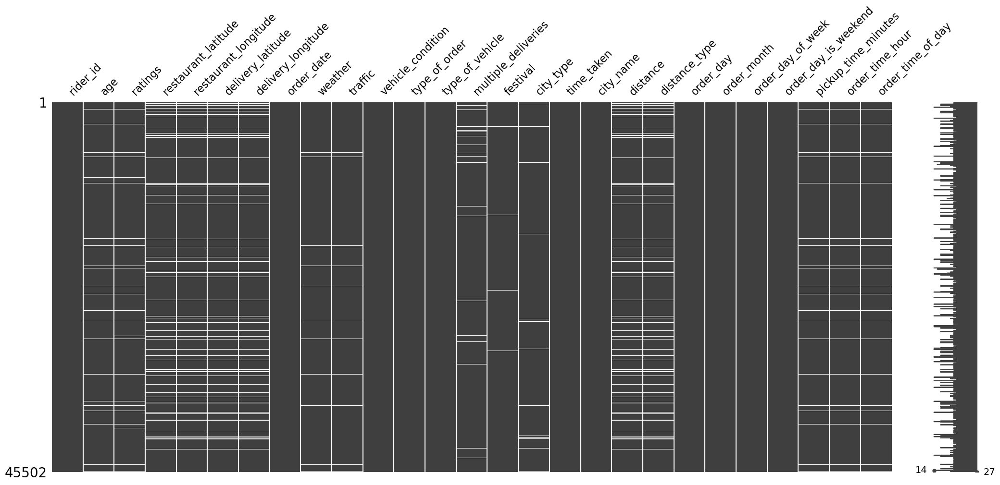

In [15]:
msno.matrix(df);

We can see that the columns that we have created using the already existing columns have the same number of missing values, e.g., `distance` is derived using the location columns. Now, there is no way of properly imputing the location columns. And as we have already derived a meaningful column `distance` using them, we can drop them and instead impute `distance`.

### Correlation heatmap

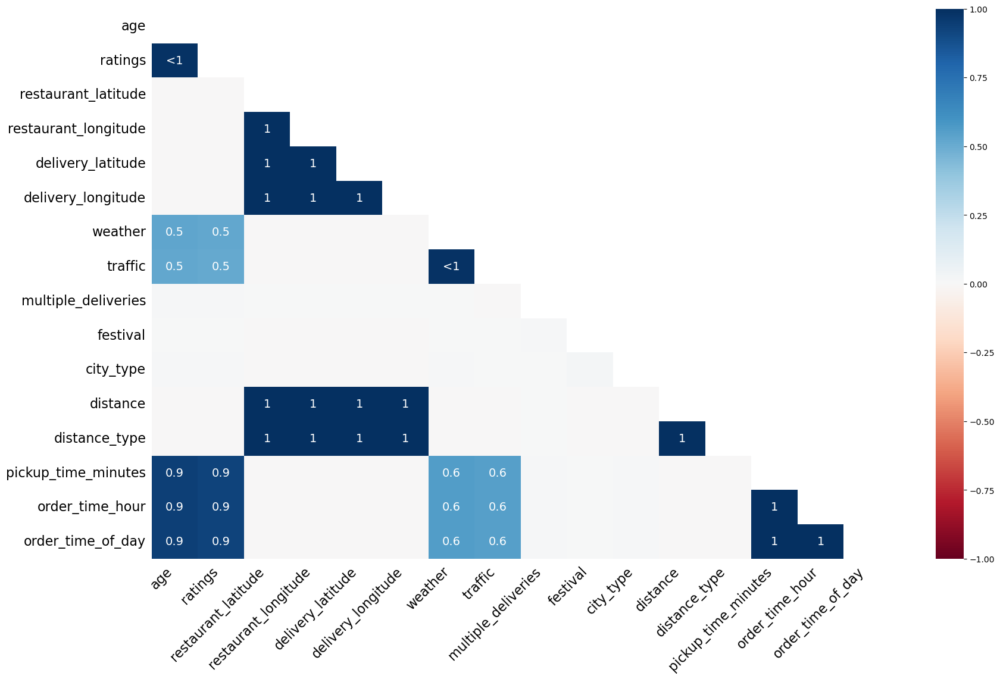

In [16]:
msno.heatmap(df);

### Dendrogram

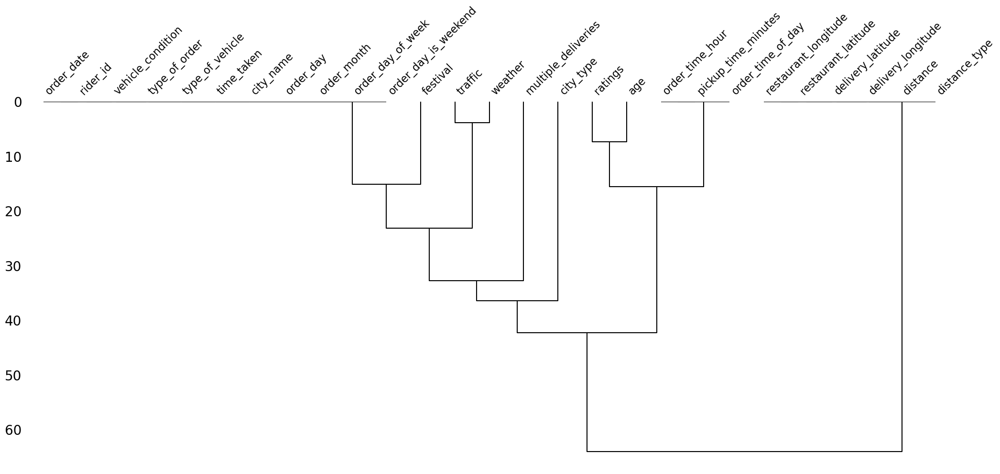

In [17]:
msno.dendrogram(df);

## Functions to perform analysis

In [18]:
def numerical_analysis(data: pd.DataFrame, col_name: str, cat_col=None, bins="auto"):
    # create the figure
    fig = plt.figure(figsize=(15, 10))
    # generate the layout
    grid = GridSpec(nrows=2, ncols=2, figure=fig)
    # set subplots
    ax1 = fig.add_subplot(grid[0, 0])
    ax2 = fig.add_subplot(grid[0, 1])
    ax3 = fig.add_subplot(grid[1, :])
    # kdeplot
    sns.kdeplot(data=data, x=col_name, hue=cat_col, ax=ax1)
    # boxplot
    sns.boxplot(data=data, x=col_name, hue=cat_col, ax=ax2)
    # histogram
    sns.histplot(data=data, x=col_name, bins=bins, hue=cat_col, kde=True, ax=ax3)
    plt.tight_layout()
    plt.show();


def categorical_numerical_analysis(data: pd.DataFrame, cat_col, num_col):
    fig, (ax1, ax2) = plt.subplots(2, 2, figsize=(15, 7.5))
    # barplot
    sns.barplot(data=data, x=cat_col, y=num_col, ax=ax1[0])
    # boxplot
    sns.boxplot(data=data, x=cat_col, y=num_col, ax=ax1[1])
    # violinplot
    sns.violinplot(data=data, x=cat_col, y=num_col, ax=ax2[0])
    # stripplot
    sns.stripplot(data=data, x=cat_col, y=num_col, ax=ax2[1])
    plt.tight_layout()
    plt.show();


def categorical_analysis(data: pd.DataFrame, col_name):
    dic = {
        "Count": data[col_name].value_counts(),
        "Percentage": data[col_name].value_counts(normalize=True).mul(100).round(2).astype("str").add("%")
    }
    df = pd.DataFrame(dic)
    display(df)
    print("#" * 150)
    unique_categories = data[col_name].unique().tolist()
    no_of_categories = data[col_name].nunique()
    print(f"\nThe unique categories in the column '{col_name}' are {unique_categories}.", end="\n\n")
    print("#" * 150)
    print(f"\nThe number of categories in the column '{col_name}' are {no_of_categories}.", end="\n\n")
    sns.countplot(data=data, x=col_name)
    plt.xticks(rotation=45)
    plt.show();


def multivariate_analysis(data: pd.DataFrame, num_col, cat_col_1, cat_col_2):
    fig, (ax1, ax2) = plt.subplots(2, 2, figsize=(15, 7.5))
    # barplot
    sns.barplot(data=data, x=cat_col_1, y=num_col, hue=cat_col_2, ax=ax1[0])
    # boxplot
    sns.boxplot(data=data, x=cat_col_1, y=num_col, hue=cat_col_2, gap=0.1, ax=ax1[1])
    # violin plot
    sns.violinplot(data=data, x=cat_col_1, y=num_col, hue=cat_col_2, gap=0.1, ax=ax2[0])
    # strip plot
    sns.stripplot(data=data, x=cat_col_1, y=num_col, hue=cat_col_2, dodge=True, ax=ax2[1])
    plt.tight_layout()
    plt.show();


def chi2_test(data: pd.DataFrame, col1, col2, alpha=0.05):
    data = data.loc[:, [col1, col2]].dropna()
    # contingency table
    contingency_table = pd.crosstab(data[col1], data[col2])
    # chi2 test
    _, p_val, _, _ = chi2_contingency(contingency_table)
    print(f"p-value: {p_val}.")
    if p_val <= alpha:
        print(f"Reject H0. The data indicates significant association between '{col1}' and '{col2}'.")
    else:
        print(f"Not enough evidence to reject H0. The data indicates no significant association between '{col1}' and '{col2}'.")


def anova_test(data: pd.DataFrame, num_col, cat_col, alpha=0.05):
    data = data.loc[:, [num_col, cat_col]].dropna()
    cat_group = data.groupby(cat_col)
    groups = [group[num_col].values for _, group in cat_group]
    f_statistic, p_val = f_oneway(*groups)
    print(f"p-value: {p_val}.")
    if p_val <= alpha:
        print(f"Reject H0. The data indicates significant relationship between '{num_col}' and '{cat_col}'.")
    else:
        print(f"Not enough evidence to reject H0. The data indicates no significant relationship between '{num_col}' and '{cat_col}'.")


def normality_test(data: pd.DataFrame, col_name, alpha=0.05):
    data = data[col_name]
    print("Jarque Bera test for normality:")
    _, p_val = jarque_bera(data)
    print(f"p-value: {p_val}.")
    if p_val <= alpha:
        print(f"Reject H0. The column '{col_name}' IS NOT normally distributed.")
    else:
        print(f"Not enough evidence to reject H0. The column '{col_name}' IS normally distributed.")

## Column-wise analysis

In [19]:
df.columns

Index(['rider_id', 'age', 'ratings', 'restaurant_latitude',
       'restaurant_longitude', 'delivery_latitude', 'delivery_longitude',
       'order_date', 'weather', 'traffic', 'vehicle_condition',
       'type_of_order', 'type_of_vehicle', 'multiple_deliveries', 'festival',
       'city_type', 'time_taken', 'city_name', 'distance', 'distance_type',
       'order_day', 'order_month', 'order_day_of_week', 'order_day_is_weekend',
       'pickup_time_minutes', 'order_time_hour', 'order_time_of_day'],
      dtype='object')

### `time_taken` (Target)

In [20]:
df["time_taken"].dtype

dtype('int32')

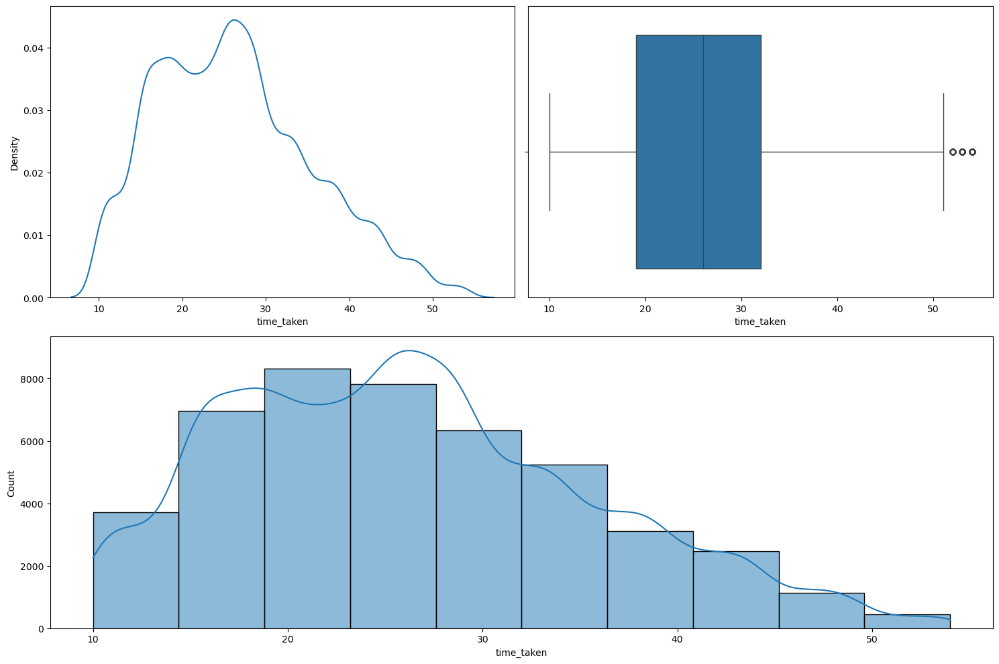

In [21]:
numerical_analysis(df, "time_taken", bins=10)

**Observations:**
* The target column is not fully continuous in nature.
* It shows dual modality with two peaks: one around the 17-18 mark, and the other around the 26-27 mark.
* It has very few extreme points. They cannot be thought of outliers as they are just extreme and rare. A delivery time of 50 mins is possible in certain rare circumstances.

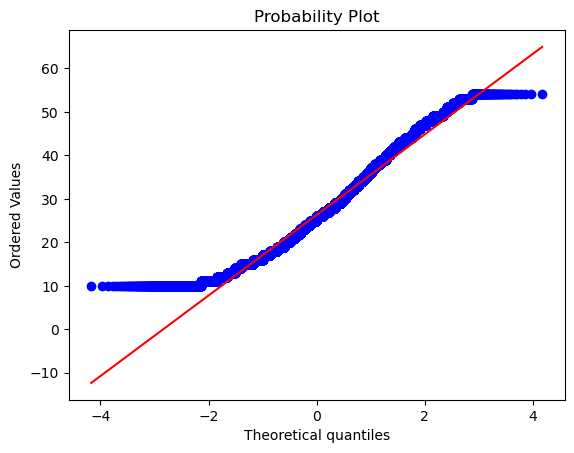

In [22]:
# Q-Q plot
probplot(df["time_taken"], plot=plt)
plt.show()

In [23]:
normality_test(df, "time_taken")

Jarque Bera test for normality:
p-value: 0.0.
Reject H0. The column 'time_taken' IS NOT normally distributed.


Let us check out the outlier rows. We will see if some features have an effect on these outliers.

In [24]:
target_25_percentile, target_75_percentile = np.percentile(df["time_taken"], [25, 75])
iqr = target_75_percentile - target_25_percentile
upper_bound = target_75_percentile + (1.5 * iqr)

In [25]:
df.loc[(df["time_taken"] > upper_bound), "traffic"].value_counts()

traffic
jam     241
high     24
Name: count, dtype: int64

We can see that the extreme values of `time_taken` (the target) correspond to the situation in which `traffic` is mostly `jam` and sometimes `high`. So the delivery takes longer when the traffic conditions are bad, which is intuitive.

In [26]:
df.loc[(df["time_taken"] > upper_bound), "weather"].value_counts()

weather
fog           57
sunny         51
cloudy        44
windy         44
stormy        37
sandstorms    32
Name: count, dtype: int64

The `weather` conditions do not seem to affect it much.

Let us now check whether the extreme values in `time_taken` have a higher average value of `distance` as compared to the general average of `distance`.

In [27]:
avg_dist = df.loc[:, "distance"].mean()
avg_dist_extremes = df.loc[(df["time_taken"] > upper_bound), "distance"].mean()

print(f"The general average of `distance` is roughly {avg_dist:.2f}, whereas its average for the extreme values of `time_taken` (the target) is roughly {avg_dist_extremes:.2f}.")

The general average of `distance` is roughly 9.72, whereas its average for the extreme values of `time_taken` (the target) is roughly 13.29.


So, clearly far away deliveries take longer.

#### Fixing `time_taken` (the target) using power transformation
We will try to make the target more close to a normal distribution using the Yeo-Johnson transformation.

In [28]:
yeo_johnson_transformer = PowerTransformer(method="yeo-johnson")

df["time_taken_yjt"] = yeo_johnson_transformer.fit_transform(df[["time_taken"]])

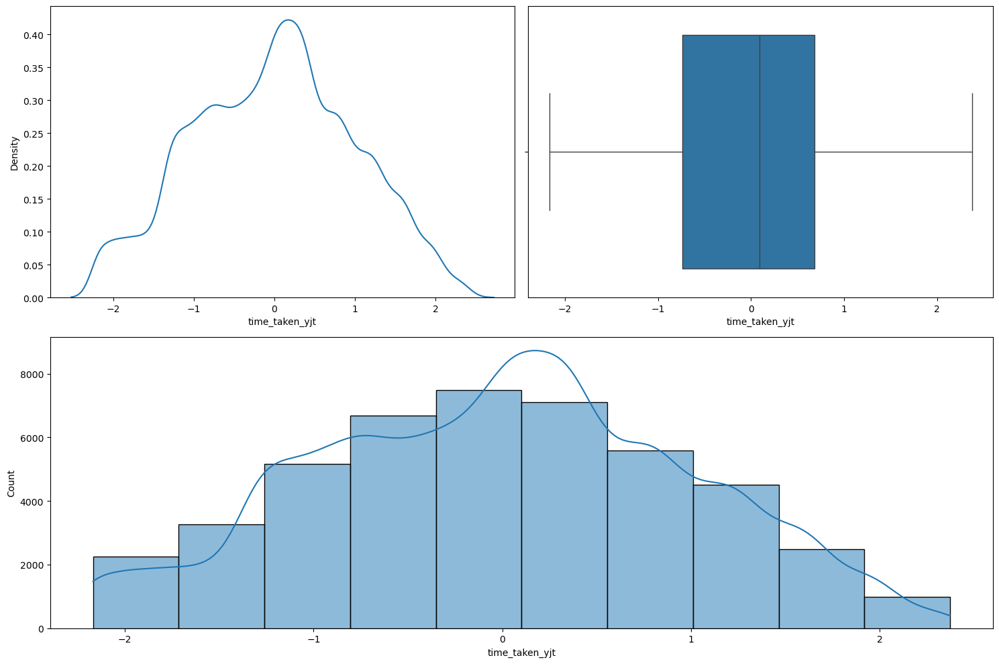

In [29]:
numerical_analysis(df, "time_taken_yjt", bins=10)

This has slightly improved our distribution. This is a lot closer to a normal distribution as compared to the bimodal distribution earlier. There are no more extreme values left.

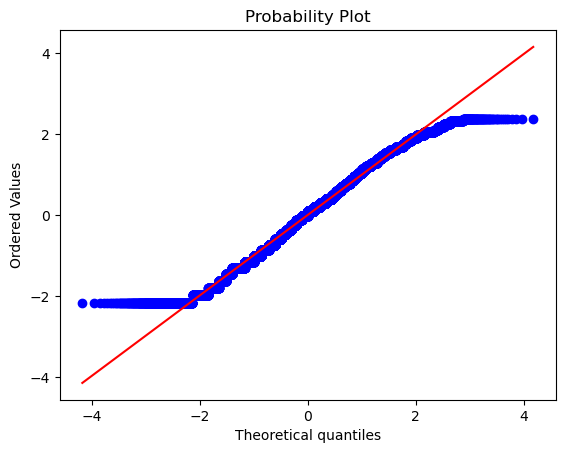

In [30]:
# Q-Q plot
probplot(df["time_taken_yjt"], plot=plt)
plt.show()

In [31]:
normality_test(df, "time_taken_yjt")

Jarque Bera test for normality:
p-value: 3.054052954737312e-145.
Reject H0. The column 'time_taken_yjt' IS NOT normally distributed.


### `rider_id`

In [32]:
df["rider_id"].dtype

dtype('O')

In [33]:
df["rider_id"].isna().sum()

0

As we have also seen earlier, `rider_id` has no missing values.

In [34]:
print(f"There are {df['rider_id'].nunique()} unique values of `rider_id`.")

There are 1320 unique values of `rider_id`.


Now, we have missing values in the columns `age` and `ratings`. Whereas, `rider_id` does not have any missing values. Let us check if we can use `rider_id` to impute the missing values in `age` and `ratings`.

In [35]:
df[["rider_id", "age", "ratings"]].head()

,rider_id,age,ratings
0,INDORES13DEL02,37.0,4.9
1,BANGRES18DEL02,34.0,4.5
2,BANGRES19DEL01,23.0,4.4
3,COIMBRES13DEL02,38.0,4.7
4,CHENRES12DEL01,32.0,4.6


In [36]:
rider_id_group = df[["rider_id", "age", "ratings"]].groupby("rider_id")

In [37]:
rider_id_group.head(5)

,rider_id,age,ratings
0,INDORES13DEL02,37.0,4.9
1,BANGRES18DEL02,34.0,4.5
2,BANGRES19DEL01,23.0,4.4
3,COIMBRES13DEL02,38.0,4.7
4,CHENRES12DEL01,32.0,4.6
...,...,...,...
37039,BHPRES06DEL03,30.0,4.5
38705,BHPRES010DEL03,37.0,4.5
39196,KOLRES010DEL03,39.0,3.8
39264,BHPRES08DEL03,39.0,4.9


In [38]:
rider_id_group.head(5).sort_values("rider_id")

,rider_id,age,ratings
92,AGRRES010DEL01,34.0,4.7
7750,AGRRES010DEL01,21.0,4.7
4558,AGRRES010DEL01,38.0,4.7
12437,AGRRES010DEL01,34.0,4.5
13244,AGRRES010DEL01,39.0,4.4
...,...,...,...
861,VADRES20DEL03,35.0,4.8
9807,VADRES20DEL03,30.0,4.6
9768,VADRES20DEL03,38.0,4.8
5099,VADRES20DEL03,35.0,4.9


We can see that for the same `rider_id`, we have different values of `age` and `ratings`. Let us check for duplicates.

In [39]:
df[["rider_id", "age", "ratings"]].dropna().duplicated(keep=False).sum()

10155

Let us filter and check these duplicates.

In [40]:
df.loc[(df[["rider_id", "age", "ratings"]].duplicated(keep=False)), ["rider_id", "age", "ratings"]].dropna().sort_values(["rider_id"])

,rider_id,age,ratings
18566,AGRRES03DEL02,24.0,4.9
40368,AGRRES03DEL02,24.0,4.9
28531,AGRRES03DEL03,30.0,4.7
26325,AGRRES03DEL03,30.0,4.7
36203,AGRRES06DEL02,36.0,4.9
...,...,...,...
12763,VADRES20DEL02,28.0,4.5
5099,VADRES20DEL03,35.0,4.9
17996,VADRES20DEL03,35.0,4.9
21995,VADRES20DEL03,37.0,4.9


Again, we can see that some values in `rider_id` have different values for `age` and `ratings`. Hence, this column does not seem reliable to impute the missing values in `age` and `ratings`. We may want to drop this column later.

### `age`

In [41]:
df["age"].dtype

dtype('float64')

In [42]:
df["age"].describe()

count    43648.000000
mean        29.555008
std          5.761482
min         20.000000
25%         25.000000
50%         30.000000
75%         35.000000
max         39.000000
Name: age, dtype: float64

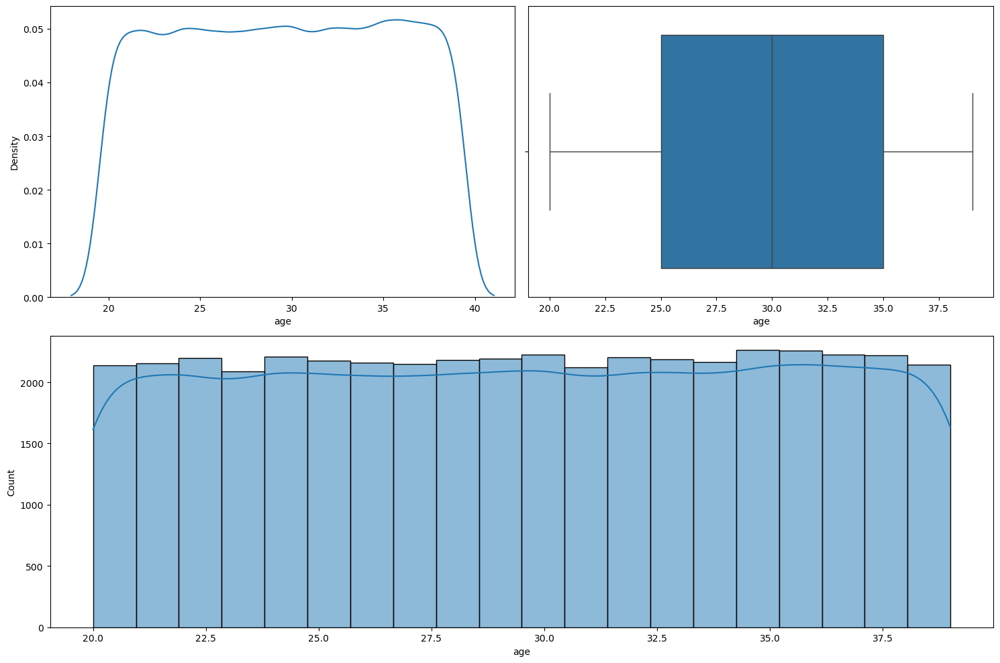

In [43]:
numerical_analysis(df, "age", bins=20)

**Observations:**
* `age` seems to be uniformly distributed between 20 to 39.

Let us now check out the relationship between the target `time_taken` and `age`.

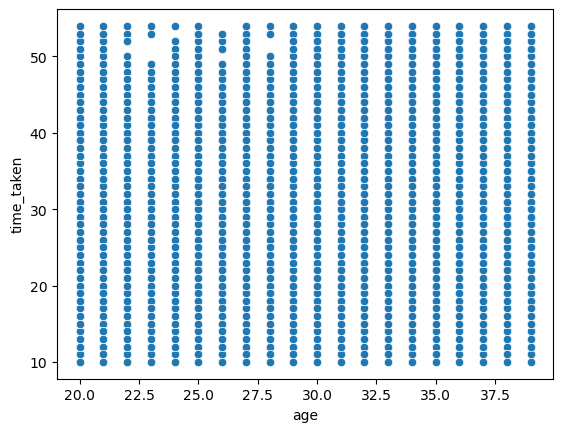

In [44]:
sns.scatterplot(data=df, x="age", y="time_taken")
plt.show()

We can see that `age` does not seem to affect the target `time_taken`. So the delivery time is not dependent on age of the delivery person. We can also see that `age` is a discrete numerical column.

Let us now include `vehicle_condition` in the same scatter plot as the `hue`.

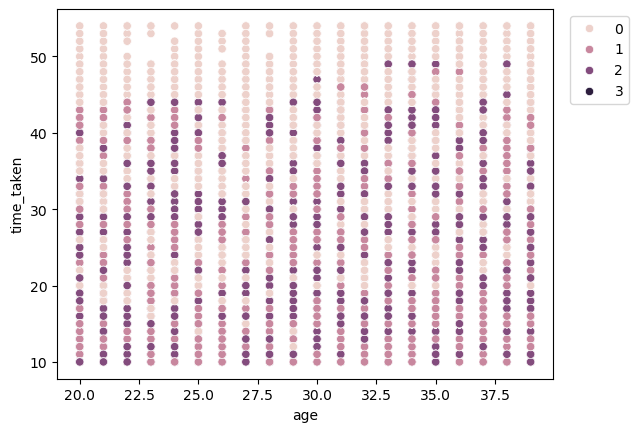

In [45]:
sns.scatterplot(data=df, x="age", y="time_taken", hue="vehicle_condition")
plt.legend(bbox_to_anchor=(1.02, 1), loc=2)
plt.show()

We can see that for higher values of `time_taken`, i.e., for longer deliveries, generally the vehicles with the best condition (0) are used.

Let us now check if there is any preference of vehicle type with `age`.

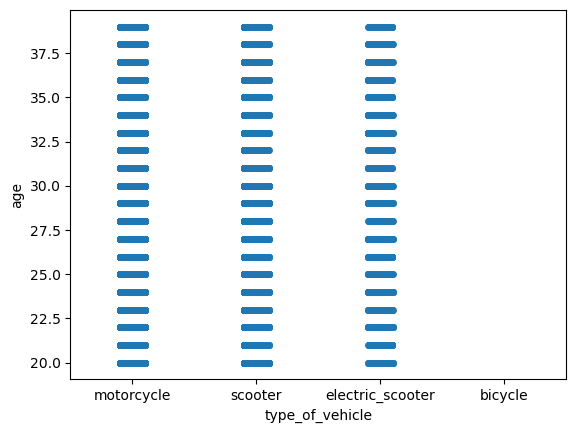

In [46]:
sns.stripplot(df, x="type_of_vehicle", y="age")
plt.show();

We can see that there is no such preference. The reason we do not seem to have any ages for bicycles may be because there are missing values in the `age` column whenever the `type_of_vehicle` is bicycle.

### `ratings`

In [47]:
df["ratings"].dtype

dtype('float64')

In [48]:
df["ratings"].describe()

count    43594.000000
mean         4.635287
std          0.313827
min          2.500000
25%          4.500000
50%          4.700000
75%          4.900000
max          5.000000
Name: ratings, dtype: float64

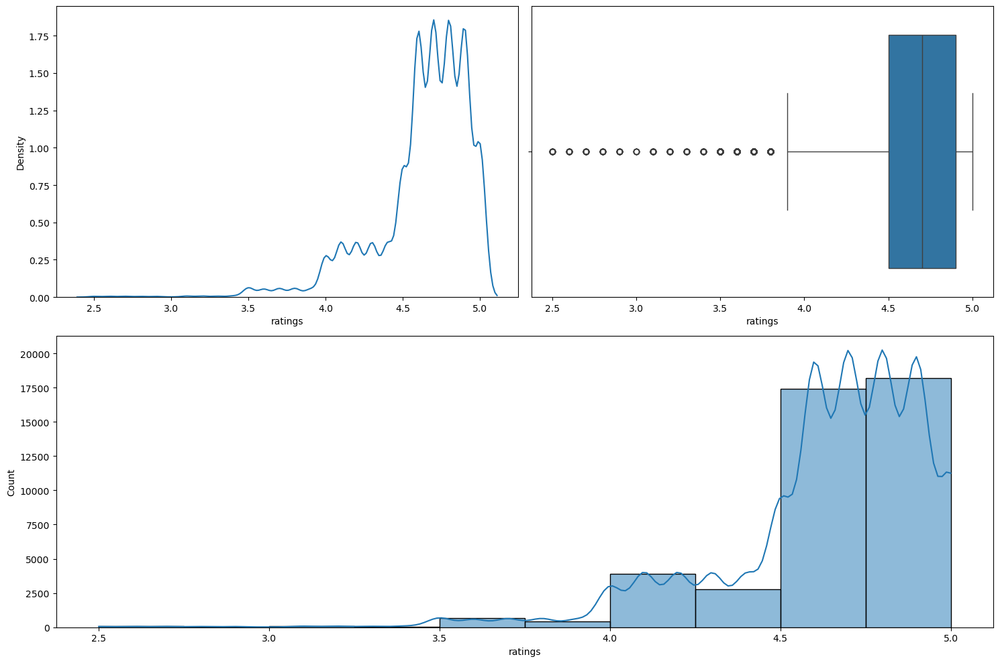

In [49]:
numerical_analysis(df, "ratings", bins=10)

We can see that most of the ratings are more than 4.

Let us now check if `ratings` have any effect on the target `time_taken`.

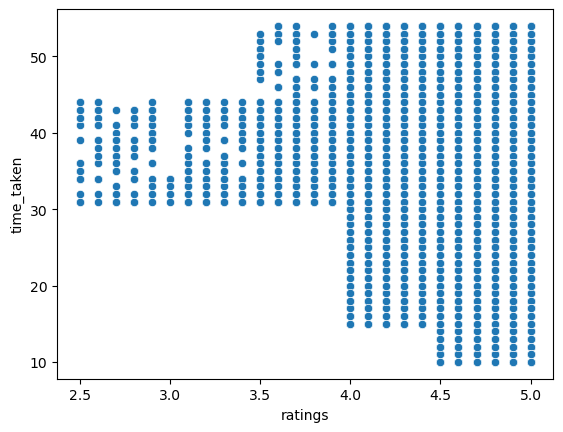

In [50]:
sns.scatterplot(data=df, x="ratings", y="time_taken")
plt.show()

We can see that the riders with high `ratings` are preferred for longer deliveries. Further, riders with high `ratings` also get more orders. So, higher `ratings` will give riders more work, and hence more income.

Let us now check if `vehicle_condition` has any effect on `ratings`.

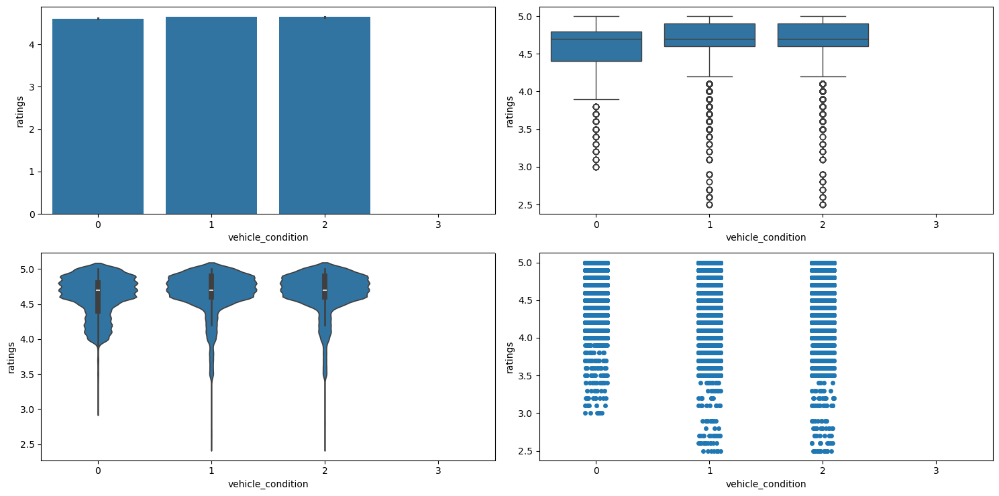

In [51]:
categorical_numerical_analysis(data=df, cat_col="vehicle_condition", num_col="ratings")

* We can see that the average `rating` seems to be very similar for the first three vehicle conditions.
* However, riders with the best `vehicle_condition` (0) have ratings of more than 3, whereas riders with the subsequent `vehicle_condition` also have `ratings` lower than 3.
* The worst `vehicle_condition` has no data for `ratings`. This may be because customers may not want to rate riders with such vehicles.

In [52]:
df[["ratings", "vehicle_condition"]].loc[df["vehicle_condition"] == 3, "ratings"].value_counts(dropna=False)

ratings
NaN    429
Name: count, dtype: int64

So, the vehicles with the worst `vehicle_condition` have no data for `ratings`.

Now let us check whether `type_of_vehicle` affects `ratings`.

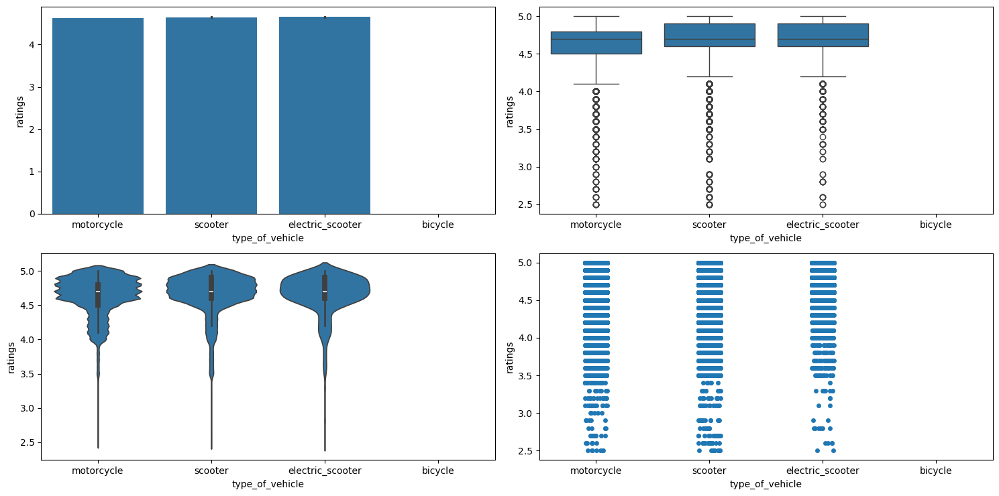

In [53]:
categorical_numerical_analysis(data=df, cat_col="type_of_vehicle", num_col="ratings")

* The mean ratings for all the `type_of_vehicle` (except bicycle) seem very similar, however the strip plot indicates that electric scooters mostly have higher `ratings` as compared to the other `type_of_vehicle`.
* Bicycles do not have `ratings` because there are NaN values in ratings if `type_of_vehicle` is bicycle.

Now, let us check whether `festival` affects `ratings`.

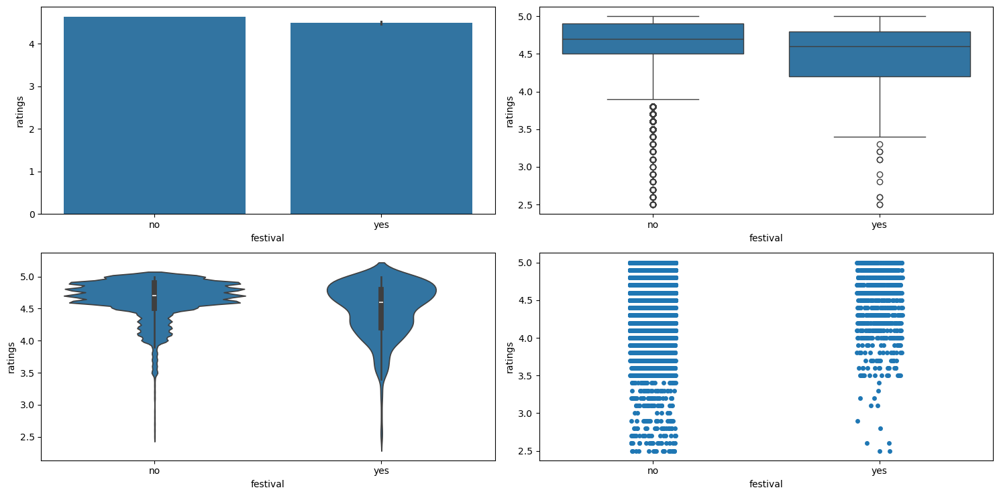

In [54]:
categorical_numerical_analysis(data=df, cat_col="festival", num_col="ratings")

* We can see that during `festival`s, the `ratings` generally go down.

### Location columns

In [55]:
location_cols = df.columns[3:7].tolist() + ["city_name"]
location_cols

['restaurant_latitude',
 'restaurant_longitude',
 'delivery_latitude',
 'delivery_longitude',
 'city_name']

In [56]:
location_subset = df.loc[:, location_cols]
location_subset.head()

,restaurant_latitude,restaurant_longitude,delivery_latitude,delivery_longitude,city_name
0,22.745049,75.892471,22.765049,75.912471,INDO
1,12.913041,77.683237,13.043041,77.813237,BANG
2,12.914264,77.678400,12.924264,77.688400,BANG
3,11.003669,76.976494,11.053669,77.026494,COIMB
4,12.972793,80.249982,13.012793,80.289982,CHEN


In [57]:
location_subset.dtypes

restaurant_latitude     float64
restaurant_longitude    float64
delivery_latitude       float64
delivery_longitude      float64
city_name                object
dtype: object

In [58]:
# dropping the missing values

location_subset.dropna(inplace=True)
location_subset.head()

,restaurant_latitude,restaurant_longitude,delivery_latitude,delivery_longitude,city_name
0,22.745049,75.892471,22.765049,75.912471,INDO
1,12.913041,77.683237,13.043041,77.813237,BANG
2,12.914264,77.678400,12.924264,77.688400,BANG
3,11.003669,76.976494,11.053669,77.026494,COIMB
4,12.972793,80.249982,13.012793,80.289982,CHEN


Let us plot these columns on a map.

In [59]:
delivery_df = pd.DataFrame({
    "latitude": location_subset["delivery_latitude"],
    "longitude": location_subset["delivery_longitude"],
    "city_name": location_subset["city_name"]
})

fig = px.scatter_mapbox(
    delivery_df,
    lat="latitude",
    lon="longitude",
    title="Delivery Points",
    hover_name="city_name",
)

fig.update_layout(
    mapbox_style="carto-positron",
    mapbox_center={"lat": 20.5937, "lon": 78.9629},  # Centered over India
    mapbox_zoom=3,
)

fig.show()

We can see that all the cities are correctly indicated in the map.

### `order_date` and related columns

In [60]:
df["order_date"].dtype

dtype('<M8[ns]')

In [61]:
df.filter(like="order").head()

,order_date,type_of_order,order_day,order_month,order_day_of_week,order_day_is_weekend,order_time_hour,order_time_of_day
0,2022-03-19,snack,19,3,saturday,1,11.0,morning
1,2022-03-25,snack,25,3,friday,0,19.0,evening
2,2022-03-19,drinks,19,3,saturday,1,8.0,morning
3,2022-04-05,buffet,5,4,tuesday,0,18.0,evening
4,2022-03-26,snack,26,3,saturday,1,13.0,afternoon


In [62]:
order_date_subset = df.loc[:, ["order_date", "order_day", "order_month", "order_day_of_week", "order_day_is_weekend", "festival"]]
order_date_subset.head()

,order_date,order_day,order_month,order_day_of_week,order_day_is_weekend,festival
0,2022-03-19,19,3,saturday,1,no
1,2022-03-25,25,3,friday,0,no
2,2022-03-19,19,3,saturday,1,no
3,2022-04-05,5,4,tuesday,0,no
4,2022-03-26,26,3,saturday,1,no


Now, let us check if `order_day_of_week` affects `time_taken`.

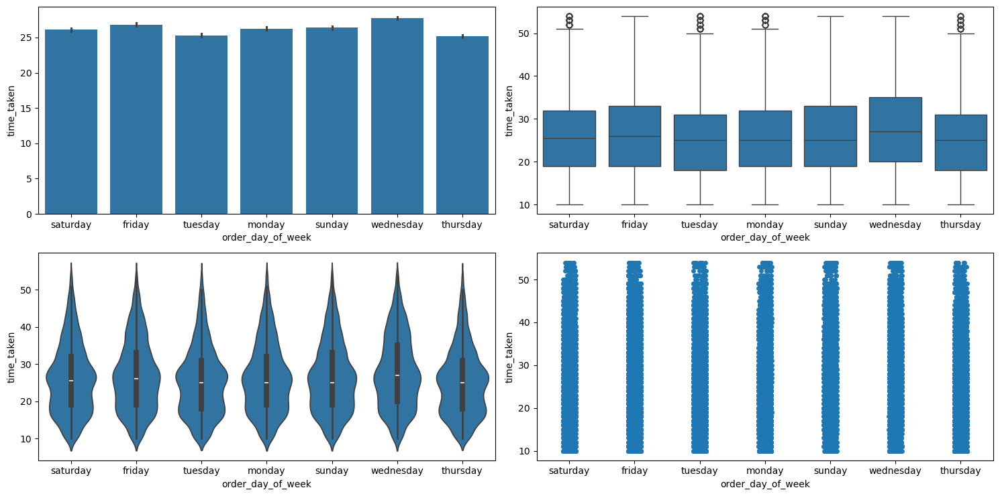

In [63]:
categorical_numerical_analysis(data=df, cat_col="order_day_of_week", num_col="time_taken")

* We can see that on an average, delivery times are slightly lesser on Thursdays.

Let us now see if `order_day_is_weekend` affects `time_taken`.

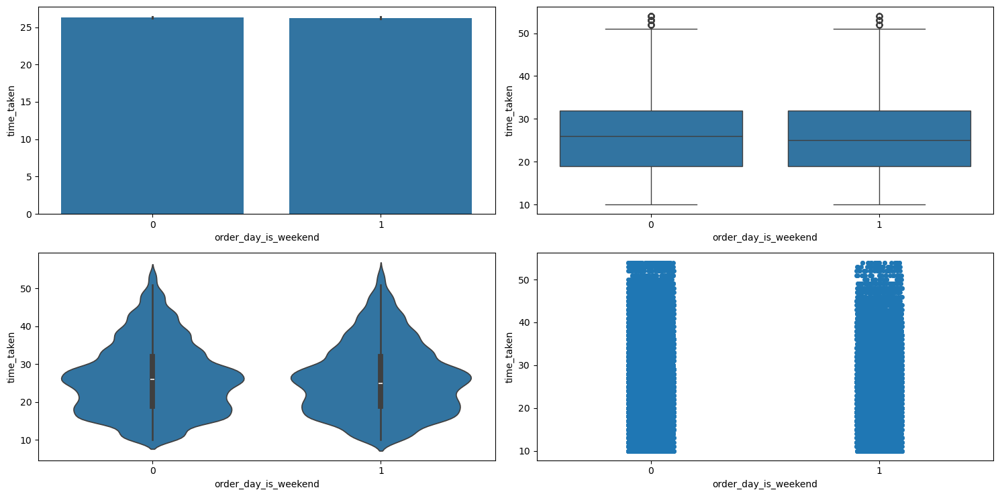

In [64]:
categorical_numerical_analysis(data=df, cat_col="order_day_is_weekend", num_col="time_taken")

* The distribution looks very similar. So it doesn't look like `order_day_is_weekend` affects the target `time_taken`.

Let us now check if `order_day_is_weekend` is associated with `traffic`.

In [65]:
chi2_test(data=df, col1="order_day_is_weekend", col2="traffic")

p-value: 0.6845961396354259.
Not enough evidence to reject H0. The data indicates no significant association between 'order_day_is_weekend' and 'traffic'.


So `order_day_is_weekend` is not associated with `traffic`.

Let us now check whether `festival` affects the target `time_taken`.

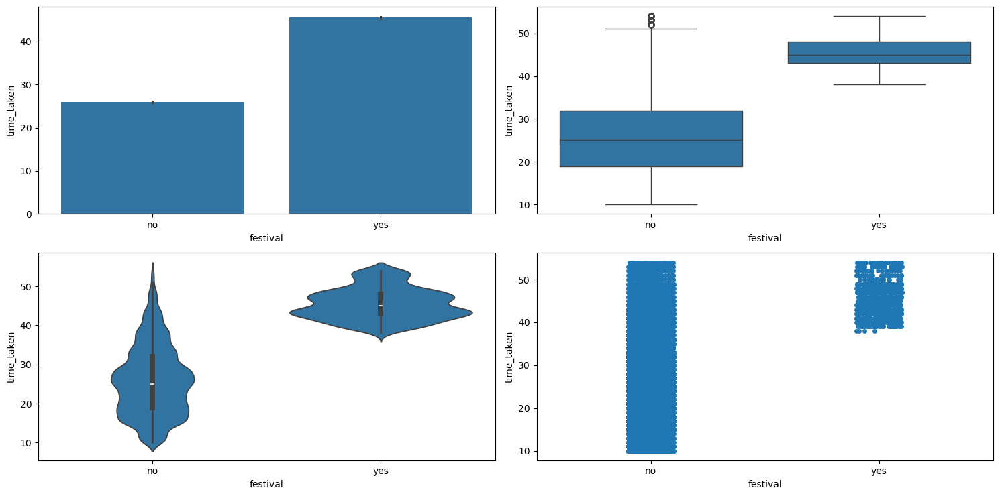

In [66]:
categorical_numerical_analysis(data=df, cat_col="festival", num_col="time_taken")

**Observations:**
* Clearly, if there is a `festival`, then the delivery time is longer on average.
* Also, the range of delivery times is shorter with lesser variation when there is a festival.

Let us now check if there is an association between `festival` and `traffic`.

In [67]:
chi2_test(data=df, col1="festival", col2="traffic")

p-value: 1.1223471129146869e-153.
Reject H0. The data indicates significant association between 'festival' and 'traffic'.


So, there is a significant association between `festival` and `traffic`.

In [68]:
df.pivot_table(index="traffic", columns="festival", values="time_taken", aggfunc="mean")

festival,no,yes
traffic,,
high,27.010373,45.826087
jam,30.538039,46.093651
low,21.284332,42.020000
medium,26.550288,43.715385


We can clearly see how `time_taken` increases with increase in `traffic` congestion.

Let us now check if a `festival` falls on a weekend, how it affects `time_taken`.

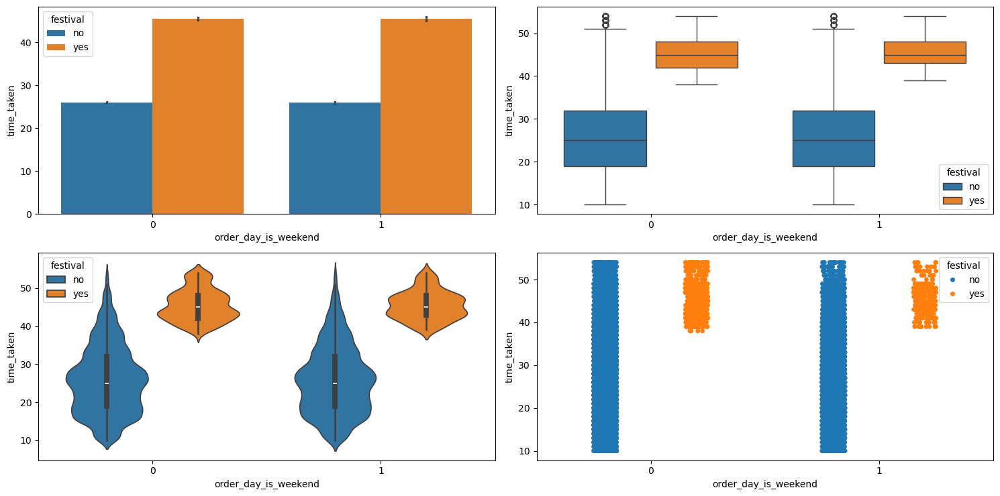

In [69]:
multivariate_analysis(data=df, num_col="time_taken", cat_col_1="order_day_is_weekend", cat_col_2="festival")

So it doesn't matter whether a `festival` falls on a weekend. The `time_taken` is similarly distributed in either case.

### `order_time` and related columns

In [70]:
time_subset = df.loc[:, ["order_time_hour", "order_time_of_day", "pickup_time_minutes"]]
time_subset.head()

,order_time_hour,order_time_of_day,pickup_time_minutes
0,11.0,morning,15.0
1,19.0,evening,5.0
2,8.0,morning,15.0
3,18.0,evening,10.0
4,13.0,afternoon,15.0


Let us now check whether `order_time_of_day` affects `time_taken`.

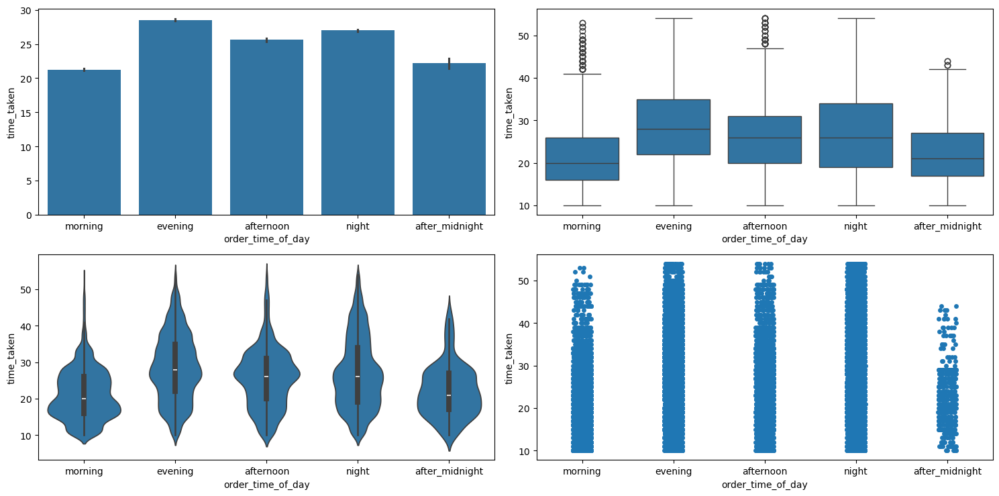

In [71]:
categorical_numerical_analysis(data=df, cat_col="order_time_of_day", num_col="time_taken")

* We can see that deliveries in the morning are the quickest whereas the deliveries in the evening are the longest. Let us confirm this by doing the ANOVA test.

In [72]:
anova_test(data=df, num_col="time_taken", cat_col="order_time_of_day")

p-value: 0.0.
Reject H0. The data indicates significant relationship between 'time_taken' and 'order_time_of_day'.


Let us now find the hours during which there are the most number of orders.

In [73]:
df["order_time_hour"].value_counts()

order_time_hour
21.0    4686
19.0    4595
22.0    4576
20.0    4539
23.0    4511
18.0    4480
17.0    4278
10.0    1991
11.0    1962
9.0     1947
8.0     1818
12.0     892
15.0     873
14.0     791
13.0     784
16.0     709
0.0      430
Name: count, dtype: int64

We can see that most orders are made in the evening and at night.

,Count,Percentage
order_time_hour,,
21.0,4686,10.68%
19.0,4595,10.48%
22.0,4576,10.43%
20.0,4539,10.35%
23.0,4511,10.28%
18.0,4480,10.21%
17.0,4278,9.75%
10.0,1991,4.54%
11.0,1962,4.47%


######################################################################################################################################################

The unique categories in the column 'order_time_hour' are [11.0, 19.0, 8.0, 18.0, 13.0, 21.0, 17.0, 20.0, 14.0, 9.0, 22.0, 12.0, 23.0, nan, 10.0, 16.0, 15.0, 0.0].

######################################################################################################################################################

The number of categories in the column 'order_time_hour' are 17.



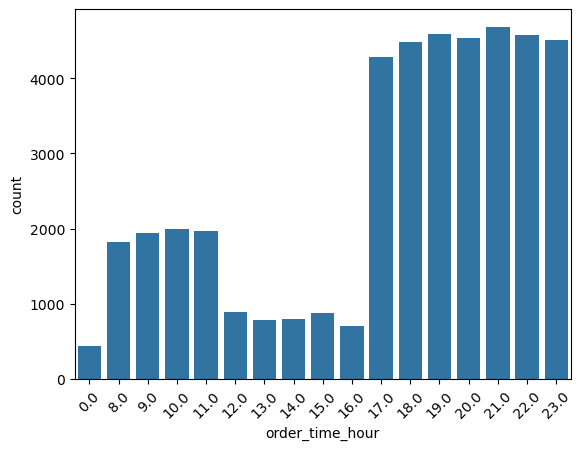

In [74]:
categorical_analysis(data=df, col_name="order_time_hour")

,Count,Percentage
order_time_of_day,,
night,18312,41.75%
evening,13353,30.44%
morning,7718,17.6%
afternoon,4049,9.23%
after_midnight,430,0.98%


######################################################################################################################################################

The unique categories in the column 'order_time_of_day' are ['morning', 'evening', 'afternoon', 'night', nan, 'after_midnight'].

######################################################################################################################################################

The number of categories in the column 'order_time_of_day' are 5.



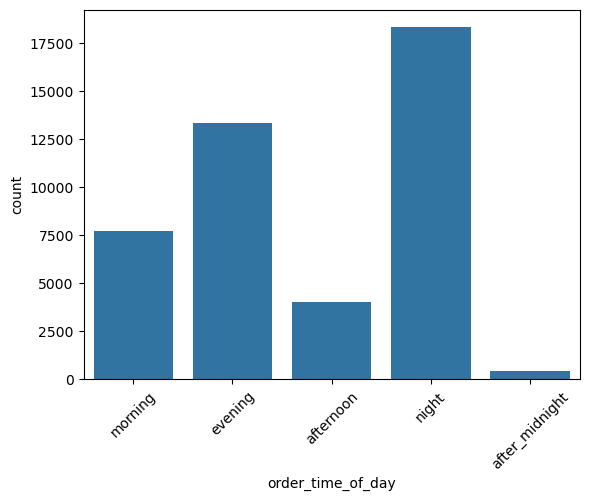

In [75]:
categorical_analysis(data=df, col_name="order_time_of_day")

### `pickup_time_minutes`

In [76]:
df["pickup_time_minutes"].dtype

dtype('float64')

Let us now check the relationship between `pickup_time_minutes` and the target `time_taken`.

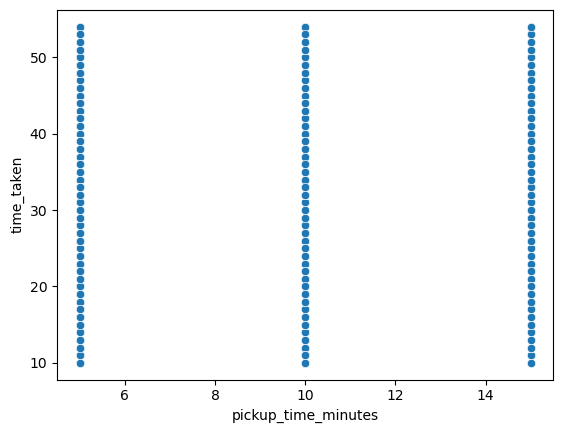

In [77]:
sns.scatterplot(df, x="pickup_time_minutes", y="time_taken")
plt.show()

* So there is no relationship between `pickup_time_minutes` and `time_taken`.
* We can also see that `pickup_time_minutes` can be treated like an ordinal categorical column.

,Count,Percentage
pickup_time_minutes,,
5.0,14703,33.52%
15.0,14610,33.31%
10.0,14549,33.17%


######################################################################################################################################################

The unique categories in the column 'pickup_time_minutes' are [15.0, 5.0, 10.0, nan].

######################################################################################################################################################

The number of categories in the column 'pickup_time_minutes' are 3.



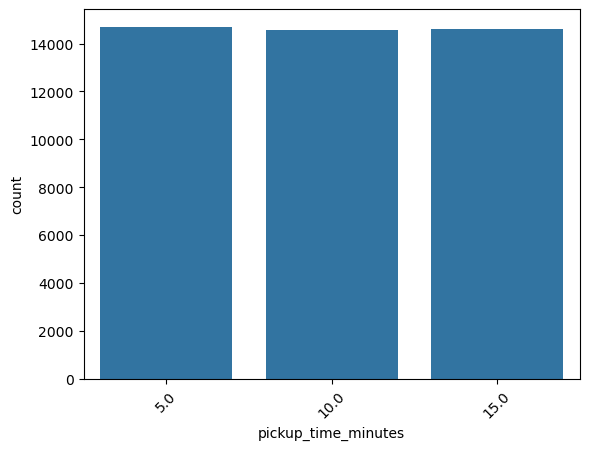

In [78]:
categorical_analysis(data=df, col_name="pickup_time_minutes")

We can see that the three categories in `pickup_time_minutes` are almost equally distributed.

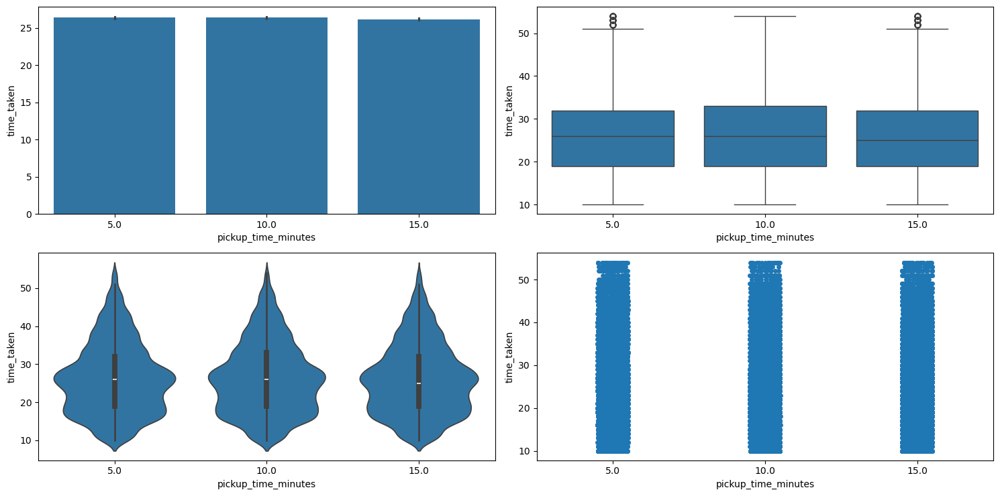

In [79]:
categorical_numerical_analysis(data=df, cat_col="pickup_time_minutes", num_col="time_taken")

Here also we can see that the different categories in `pickup_time_minutes` have no relation with the target `time_taken`. Let us confirm this with the help of ANOVA test.

In [80]:
anova_test(data=df, num_col="time_taken", cat_col="pickup_time_minutes")

p-value: 0.09932647028954891.
Not enough evidence to reject H0. The data indicates no significant relationship between 'time_taken' and 'pickup_time_minutes'.


### `traffic`

In [81]:
df["traffic"].dtype

dtype('O')

,Count,Percentage
traffic,,
low,15477,34.4%
jam,14143,31.43%
medium,10947,24.33%
high,4425,9.84%


######################################################################################################################################################

The unique categories in the column 'traffic' are ['high', 'jam', 'low', 'medium', nan].

######################################################################################################################################################

The number of categories in the column 'traffic' are 4.



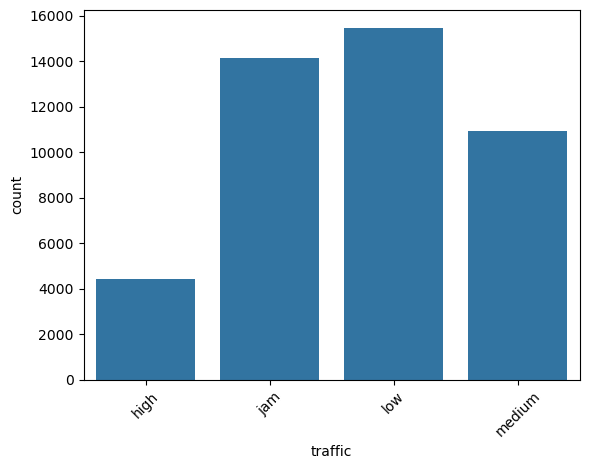

In [82]:
categorical_analysis(data=df, col_name="traffic")

Let us now check whether there is any association between `traffic` and `city_type` using ANOVA test.

In [83]:
chi2_test(data=df, col1="traffic", col2="city_type")

p-value: 2.3390790568495405e-104.
Reject H0. The data indicates significant association between 'traffic' and 'city_type'.


So there is a significant association between `traffic` and `city_type`.

What about `traffic` and `city_name`?

In [84]:
chi2_test(data=df, col1="traffic", col2="city_name")

p-value: 0.4978080180955253.
Not enough evidence to reject H0. The data indicates no significant association between 'traffic' and 'city_name'.


So, there is no association between `traffic` and `city_name`.

Let us now check if `traffic` affects the target `time_taken`.

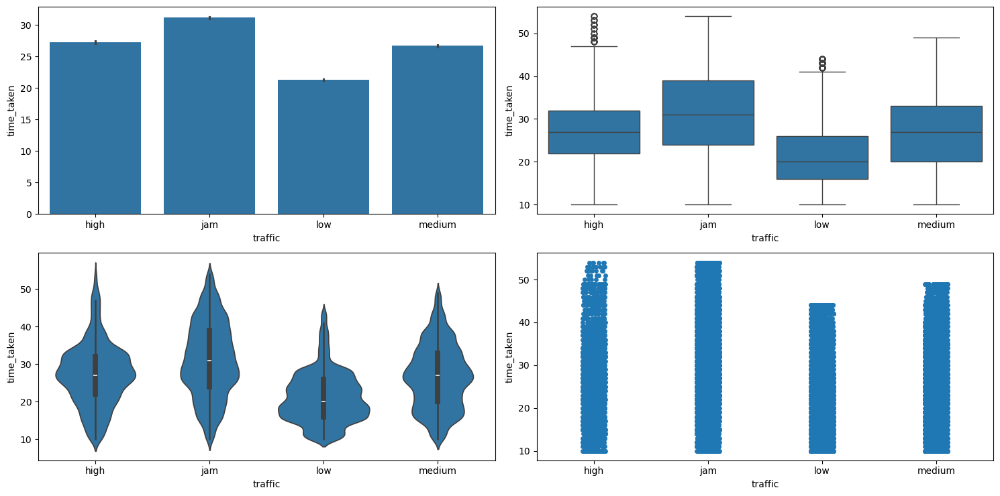

In [85]:
categorical_numerical_analysis(data=df, cat_col="traffic", num_col="time_taken")

* Clearly, `time_taken` is lower when `traffic` has the least congestion, and vice versa.

In [86]:
anova_test(data=df, num_col="time_taken", cat_col="traffic")

p-value: 0.0.
Reject H0. The data indicates significant relationship between 'time_taken' and 'traffic'.


Let us check if some `type_of_vehicle`s are better in bad `traffic` in terms of `time_taken`.

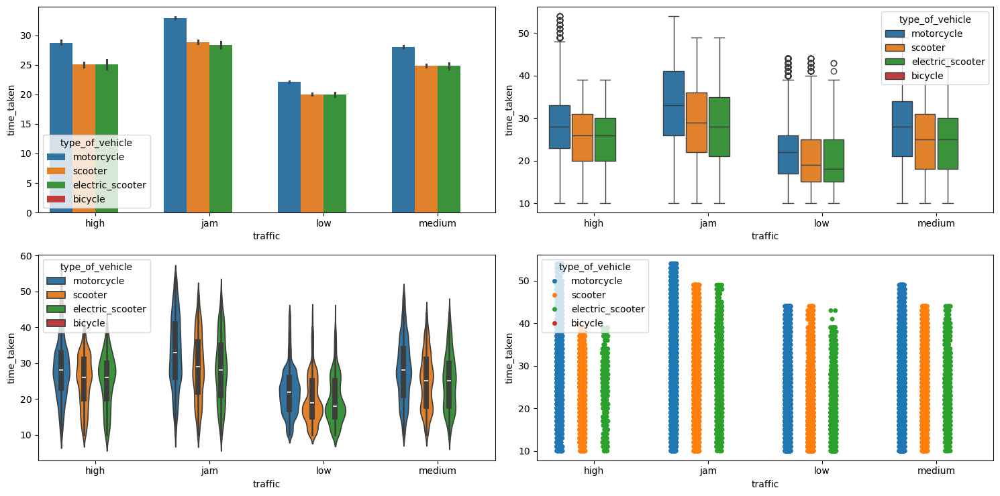

In [87]:
multivariate_analysis(data=df, num_col="time_taken", cat_col_1="traffic", cat_col_2="type_of_vehicle")

* We can see that motorcycles take longer time as compared to scooters and electric scooters. Bicycle has no points due to it having missing values in the corresponding `traffic` column, maybe due to the fact that bicycle people do not use smart phones.

Let us now see if `traffic` and `vehicle_condition` have an effect on the target `time_taken`.

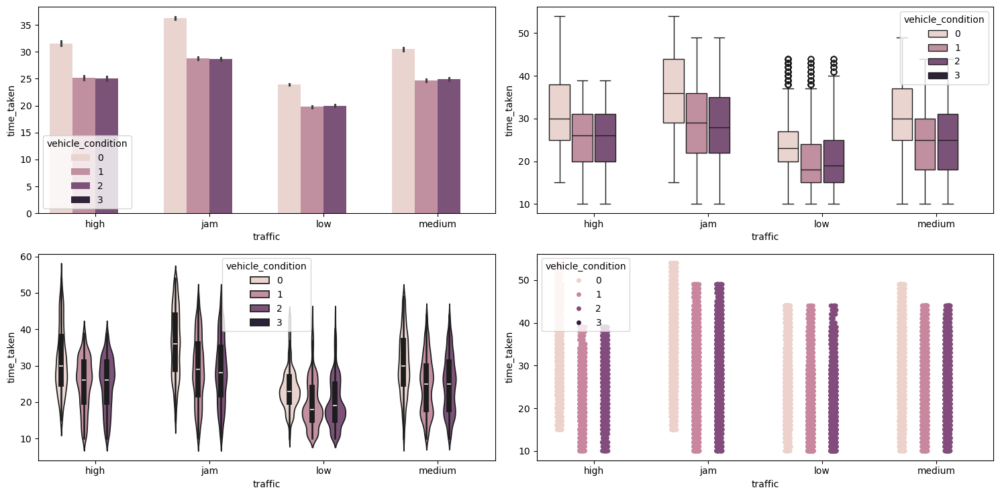

In [88]:
multivariate_analysis(data=df, num_col="time_taken", cat_col_1="traffic", cat_col_2="vehicle_condition")

* We can see that vehicles with the best condition have longer `time_taken`. This may be because the vehicles with the best `vehicle_condition` are preferred for longer deliveries.

Let us now check if `festival` and `vehicle_condition` have an effect on the target `time_taken`.

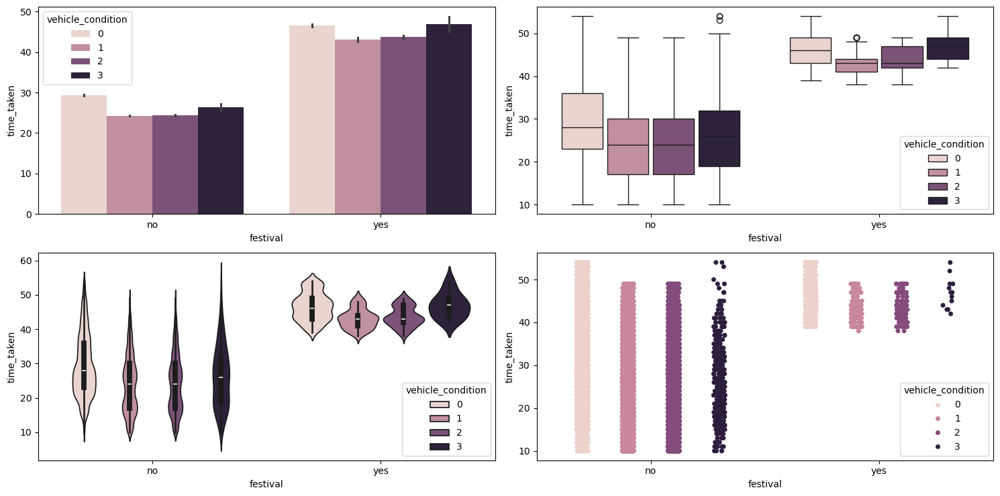

In [89]:
multivariate_analysis(data=df, num_col="time_taken", cat_col_1="festival", cat_col_2="vehicle_condition")

* We can see that during `festival`s the vehicles with the worst `vehicle_condition` take longer, maybe due to breakdowns. They are also getting less orders during festivals, as evident from the strip plot (bottom right).

### `multiple_deliveries`

In [90]:
df["multiple_deliveries"].dtype

dtype('float64')

In [91]:
df["multiple_deliveries"].unique()

array([ 0.,  1.,  3., nan,  2.])

Even `multiple_deliveries` is like a categorical column. Let us check if it has any effect on the target `time_taken`.

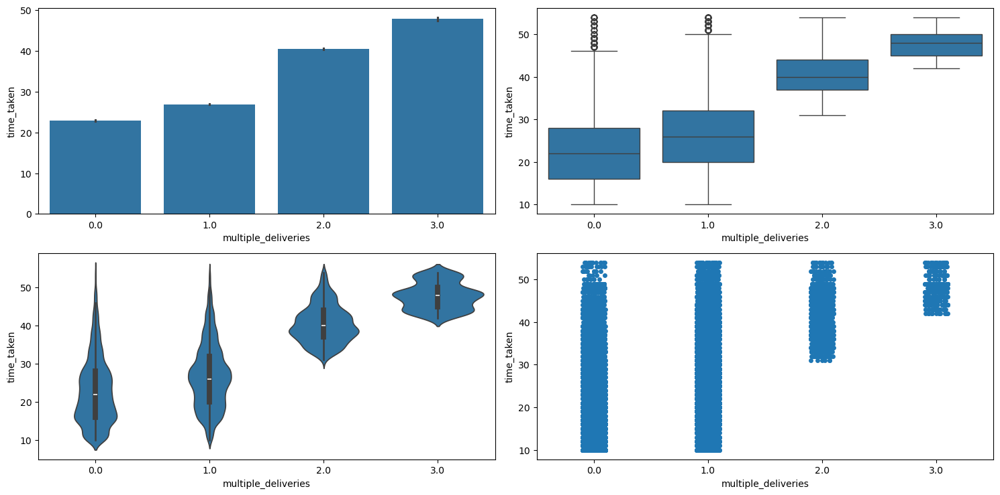

In [92]:
categorical_numerical_analysis(data=df, cat_col="multiple_deliveries", num_col="time_taken")

* Clearly, more deliveries take longer time.

In [93]:
anova_test(data=df, num_col="time_taken", cat_col="multiple_deliveries")

p-value: 0.0.
Reject H0. The data indicates significant relationship between 'time_taken' and 'multiple_deliveries'.


Let us now check if more `multiple_deliveries` correspond to longer `distance`s.

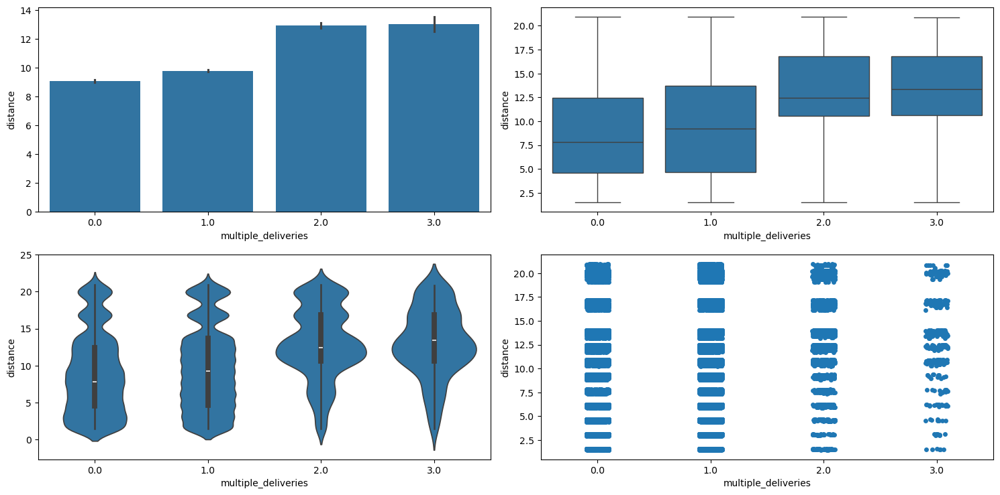

In [94]:
categorical_numerical_analysis(data=df, cat_col="multiple_deliveries", num_col="distance")

* We can see that with more `multiple_deliveries`, the `distance` also increases.

### `weather`

In [95]:
df["weather"].dtype

dtype('O')

,Count,Percentage
weather,,
fog,7654,17.02%
stormy,7586,16.87%
cloudy,7536,16.76%
sandstorms,7495,16.66%
windy,7422,16.5%
sunny,7284,16.19%


######################################################################################################################################################

The unique categories in the column 'weather' are ['sunny', 'stormy', 'sandstorms', 'cloudy', 'fog', 'windy', nan].

######################################################################################################################################################

The number of categories in the column 'weather' are 6.



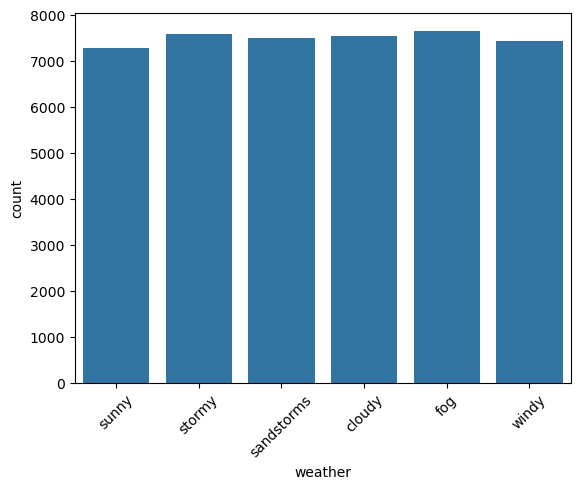

In [96]:
categorical_analysis(data=df, col_name="weather")

We can see that the categories in `weather` are uniformly distributed. There is no imbalance.

Let us now check whether `weather` has an impact on `time_taken`.

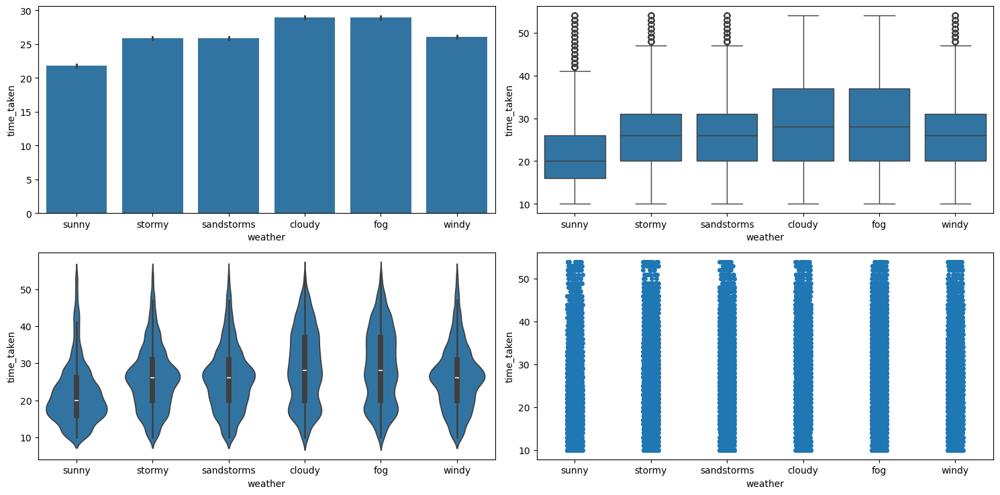

In [97]:
categorical_numerical_analysis(data=df, cat_col="weather", num_col="time_taken")

* We can see that `time_taken` is higher for bad `weather`.

In [98]:
anova_test(data=df, num_col="time_taken", cat_col="weather")

p-value: 0.0.
Reject H0. The data indicates significant relationship between 'time_taken' and 'weather'.


Let us now check if `weather` impacts `traffic`.

In [99]:
chi2_test(data=df, col1="weather", col2="traffic")

p-value: 0.4796388074753828.
Not enough evidence to reject H0. The data indicates no significant association between 'weather' and 'traffic'.


Let us now check if `weather` and `traffic` affect `time_taken`.

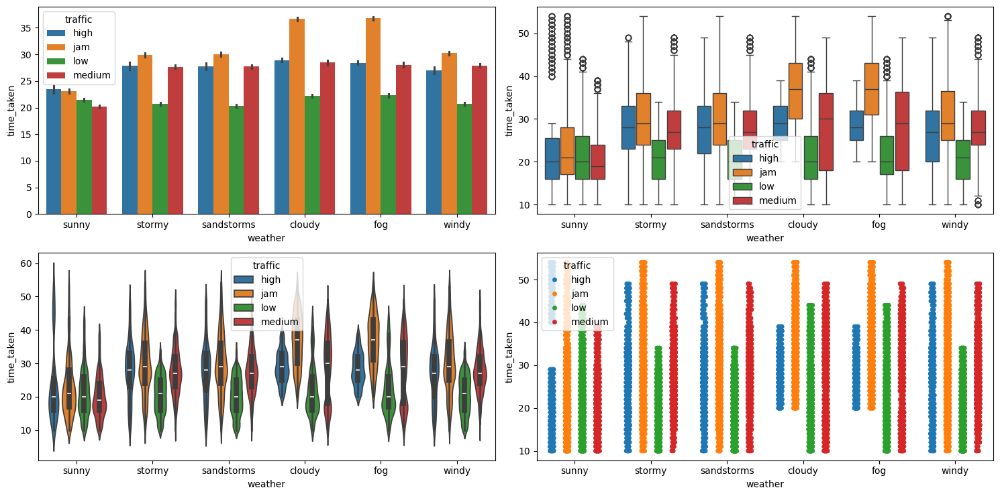

In [100]:
multivariate_analysis(data=df, num_col="time_taken", cat_col_1="weather", cat_col_2="traffic")

* We can see that `traffic` has a similar distribution with respect to `time_taken` in all `weather` conditions. So, `traffic` is a more important feature as compared to `weather` for predicting `time_taken`.

In [101]:
df.pivot_table(index="weather", columns="traffic", values="time_taken", aggfunc="mean")

traffic,high,jam,low,medium
weather,,,,
cloudy,28.940860,36.689655,22.208445,28.483134
fog,28.426546,36.806916,22.303427,28.044816
sandstorms,27.711840,30.018758,20.297049,27.738522
stormy,27.845839,29.850194,20.681734,27.680502
sunny,23.448980,23.082132,21.449293,20.195518
windy,26.972789,30.219056,20.665862,27.888769


### `vehicle_condition`

In [102]:
df["vehicle_condition"].dtype

dtype('int64')

In [103]:
df["vehicle_condition"].unique()

array([2, 0, 1, 3], dtype=int64)

Clearly, this is also like a categorical column.

,Count,Percentage
vehicle_condition,,
2,15034,33.04%
1,15030,33.03%
0,15009,32.99%
3,429,0.94%


######################################################################################################################################################

The unique categories in the column 'vehicle_condition' are [2, 0, 1, 3].

######################################################################################################################################################

The number of categories in the column 'vehicle_condition' are 4.



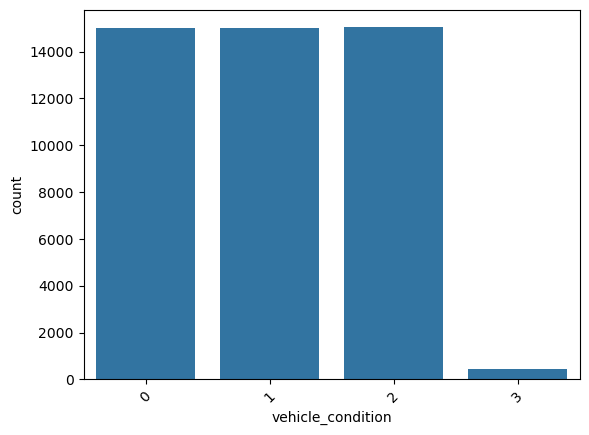

In [104]:
categorical_analysis(data=df, col_name="vehicle_condition")

We can see that the worst `vehicle_condition` (3) is rare. We will need to handle it.

Let us see if `vehicle_condition` affects `time_taken`.

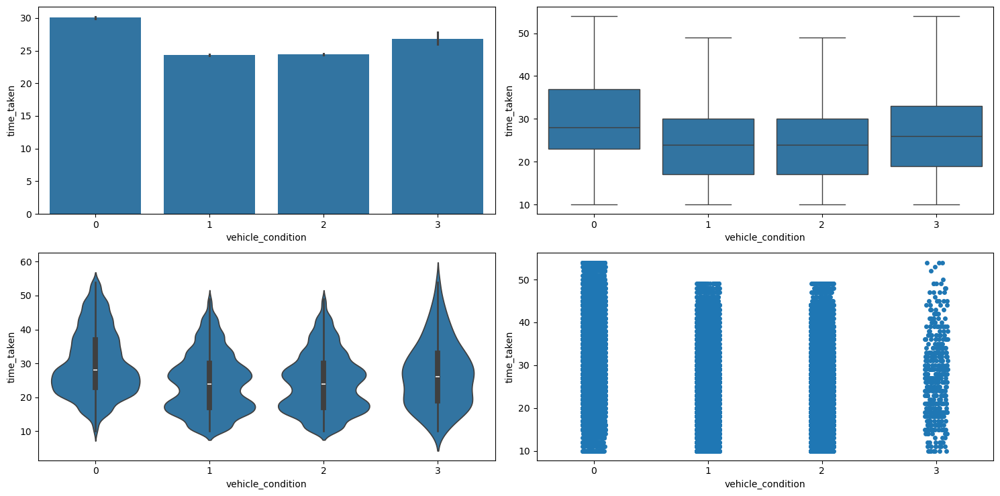

In [105]:
categorical_numerical_analysis(data=df, cat_col="vehicle_condition", num_col="time_taken")

* We can see that the vehicles with the best `vehicle_condition` take longer. This is because such vehicles are preferred for longer deliveries.

In [106]:
anova_test(data=df, num_col="time_taken", cat_col="vehicle_condition")

p-value: 0.0.
Reject H0. The data indicates significant relationship between 'time_taken' and 'vehicle_condition'.


### `type_of_vehicle`

In [107]:
df["type_of_vehicle"].dtype

dtype('O')

,Count,Percentage
type_of_vehicle,,
motorcycle,26427,58.08%
scooter,15244,33.5%
electric_scooter,3778,8.3%
bicycle,53,0.12%


######################################################################################################################################################

The unique categories in the column 'type_of_vehicle' are ['motorcycle', 'scooter', 'electric_scooter', 'bicycle'].

######################################################################################################################################################

The number of categories in the column 'type_of_vehicle' are 4.



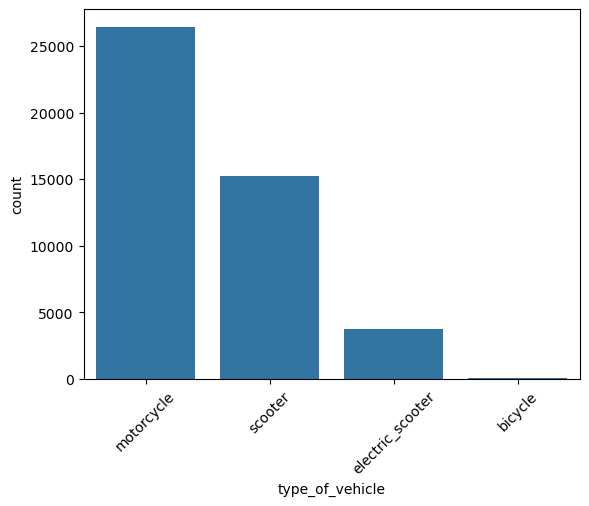

In [108]:
categorical_analysis(data=df, col_name="type_of_vehicle")

We can see that bicycles are extremely rare. We will have to handle it.

Let us now see if `type_of_vehicle` has any effect on the target `time_taken`.

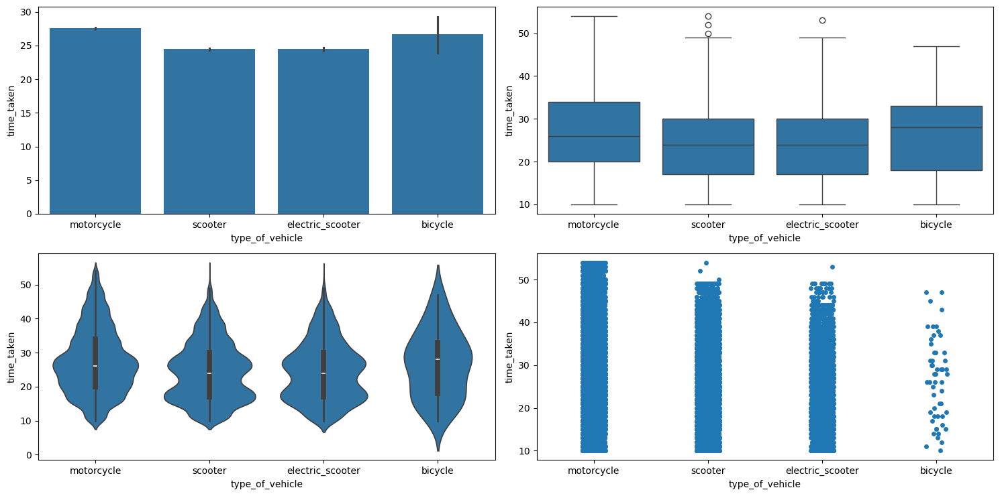

In [109]:
categorical_numerical_analysis(data=df, cat_col="type_of_vehicle", num_col="time_taken")

* We can see that motorcycles are preferred for longer deliveries.

Let us see how `vehicle_condition` and `type_of_vehicle` affects `time_taken`.

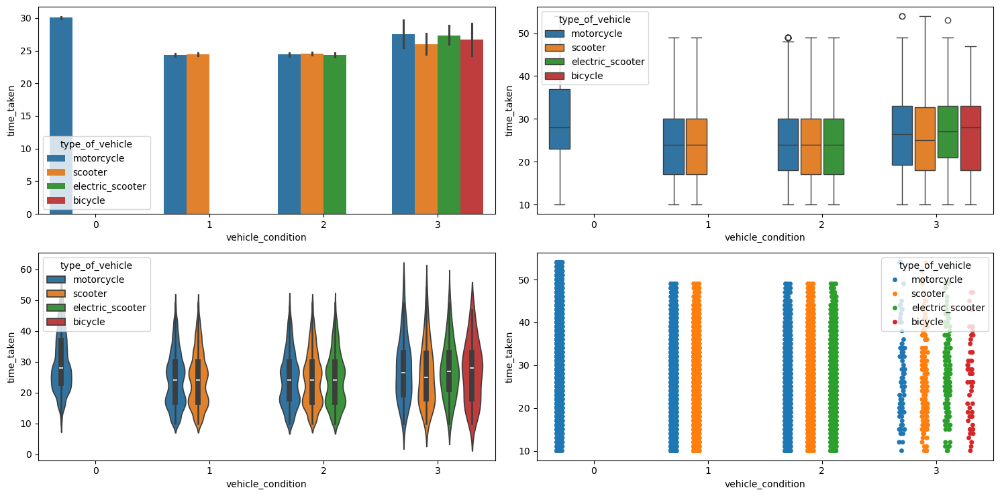

In [110]:
multivariate_analysis(data=df, num_col="time_taken", cat_col_1="vehicle_condition", cat_col_2="type_of_vehicle")

* The best `vehicle_condition` only has motorcycles. The next best `vehicle_condition` has motorcycles and scooters; the next best has motorcycles, scooters, and electric scooters; and the worst `vehicle_condition` has all, i.e., motorcycles, scooters, electric scooters, and bicycles.
* The delivery times for motorcycles is the highest mostly because they are getting long distance deliveries.

Let us check if there is an association between `type_of_vehicle` and `vehicle_condition`.

In [111]:
chi2_test(data=df, col1="type_of_vehicle", col2="vehicle_condition")

p-value: 0.0.
Reject H0. The data indicates significant association between 'type_of_vehicle' and 'vehicle_condition'.


### `type_of_order`

In [112]:
df["type_of_order"].dtype

dtype('O')

,Count,Percentage
type_of_order,,
snack,11512,25.3%
meal,11435,25.13%
drinks,11294,24.82%
buffet,11261,24.75%


######################################################################################################################################################

The unique categories in the column 'type_of_order' are ['snack', 'drinks', 'buffet', 'meal'].

######################################################################################################################################################

The number of categories in the column 'type_of_order' are 4.



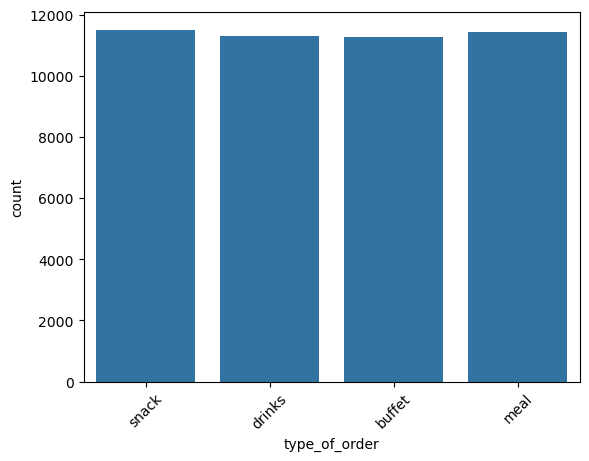

In [113]:
categorical_analysis(data=df, col_name="type_of_order")

* All the `type_of_order`s are mostly uniformly distributed.

Let us check whether `type_of_order` affects the target `time_taken`.

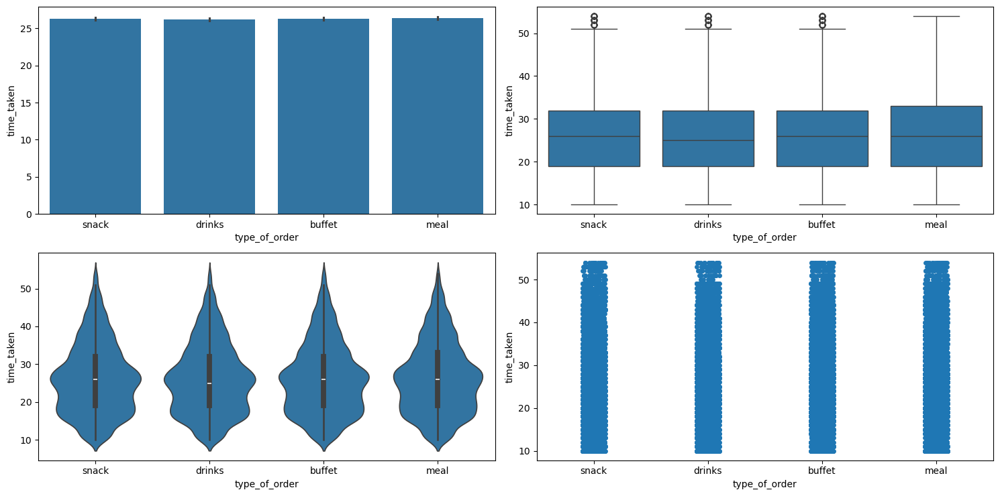

In [114]:
categorical_numerical_analysis(data=df, cat_col="type_of_order", num_col="time_taken")

It looks like `type_of_order` does not affect `time_taken`. Let us confirm this using ANOVA test.

In [115]:
anova_test(data=df, num_col="time_taken", cat_col="type_of_order")

p-value: 0.3043309877239704.
Not enough evidence to reject H0. The data indicates no significant relationship between 'time_taken' and 'type_of_order'.


Let us check whether some `type_of_order`s are more favourable on weekends.

In [116]:
pd.crosstab(df["type_of_order"], df["order_day_is_weekend"])

order_day_is_weekend,0,1
type_of_order,,
buffet,8238,3023
drinks,8130,3164
meal,8290,3145
snack,8337,3175


No the proportions are the same.

Let us check if `type_of_order` affects `pickup_time_minutes`.

In [117]:
chi2_test(data=df, col1="pickup_time_minutes", col2="type_of_order")

p-value: 0.49118080317709845.
Not enough evidence to reject H0. The data indicates no significant association between 'pickup_time_minutes' and 'type_of_order'.


There is no association.

Let us check whether `type_of_order` has any effect on `ratings`.

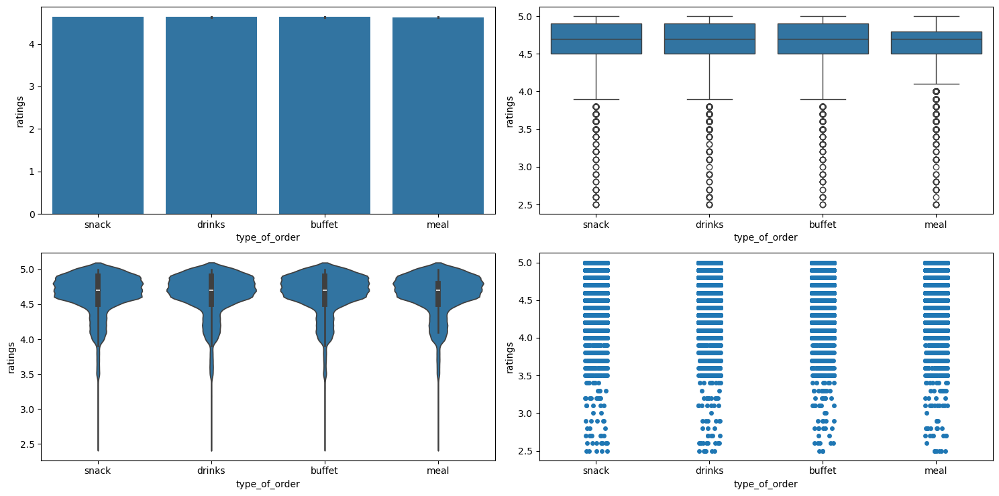

In [118]:
categorical_numerical_analysis(data=df, cat_col="type_of_order", num_col="ratings")

* It looks like `type_of_order` has no effect on `ratings`.

Let us check if there is any effect of `order_day_is_weekend` on `type_of_order`.

In [119]:
chi2_test(data=df, col1="order_day_is_weekend", col2="type_of_order")

p-value: 0.2658161540207276.
Not enough evidence to reject H0. The data indicates no significant association between 'order_day_is_weekend' and 'type_of_order'.


Let us check if there is any effect of `festival` on `type_of_order`.

In [120]:
chi2_test(data=df, col1="festival", col2="type_of_order")

p-value: 0.6149018072722126.
Not enough evidence to reject H0. The data indicates no significant association between 'festival' and 'type_of_order'.


### `city_name`

In [121]:
df["city_name"].dtype

dtype('O')

,Count,Percentage
city_name,,
JAP,3439,7.56%
RANCHI,3222,7.08%
BANG,3184,7.0%
SUR,3182,6.99%
HYD,3177,6.98%
MUM,3168,6.96%
MYS,3164,6.95%
COIMB,3162,6.95%
VAD,3159,6.94%


######################################################################################################################################################

The unique categories in the column 'city_name' are ['INDO', 'BANG', 'COIMB', 'CHEN', 'HYD', 'RANCHI', 'MYS', 'DEH', 'KOC', 'PUNE', 'LUDH', 'KNP', 'MUM', 'KOL', 'JAP', 'SUR', 'GOA', 'AURG', 'AGR', 'VAD', 'ALH', 'BHP'].

######################################################################################################################################################

The number of categories in the column 'city_name' are 22.



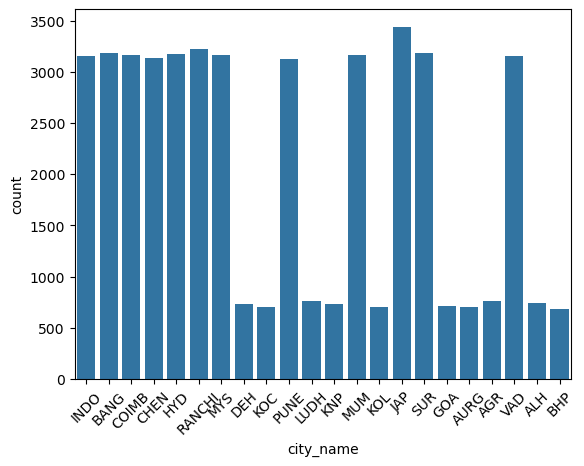

In [122]:
categorical_analysis(data=df, col_name="city_name")

Let us check whether `city_name` has any effect on `time_taken`.

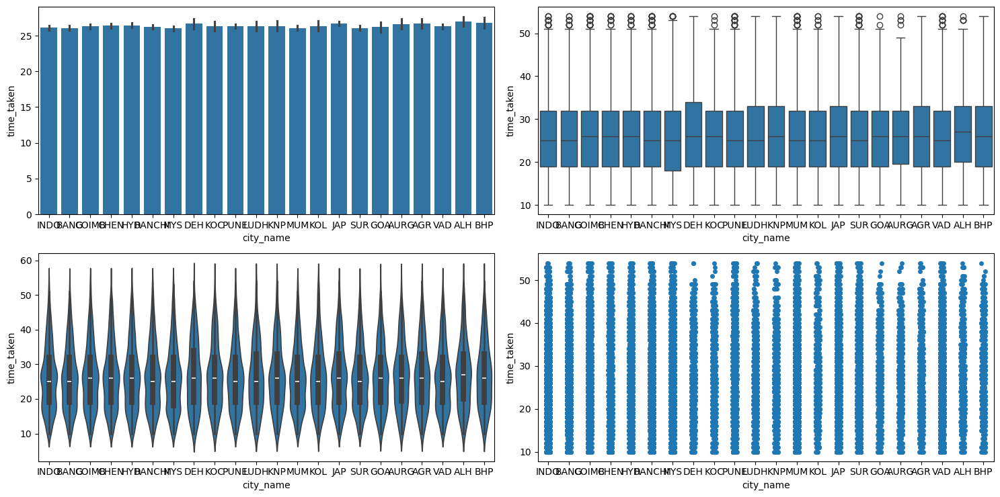

In [123]:
categorical_numerical_analysis(data=df, cat_col="city_name", num_col="time_taken")

* It looks like there is no significant effect of `city_name` on `time_taken`.

### `city_type`

In [124]:
df["city_type"].dtype

dtype('O')

,Count,Percentage
city_type,,
metropolitian,34029,76.81%
urban,10111,22.82%
semi-urban,164,0.37%


######################################################################################################################################################

The unique categories in the column 'city_type' are ['urban', 'metropolitian', 'semi-urban', nan].

######################################################################################################################################################

The number of categories in the column 'city_type' are 3.



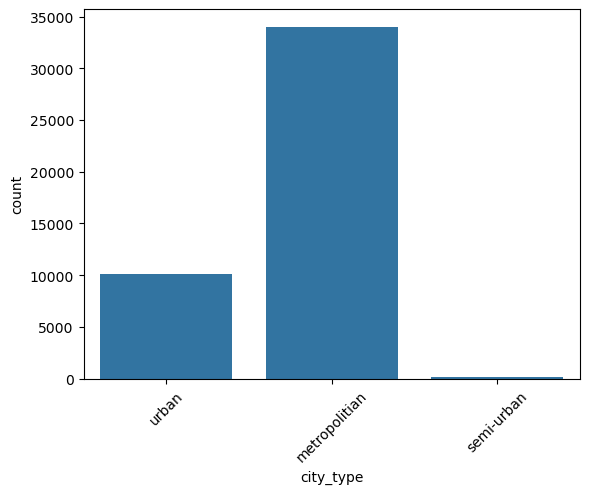

In [125]:
categorical_analysis(data=df, col_name="city_type")

* We can see that semi-urban `city_type` is extremely rare. We will need to handle it.

Let us now see if `city_type` affects `time_taken`.

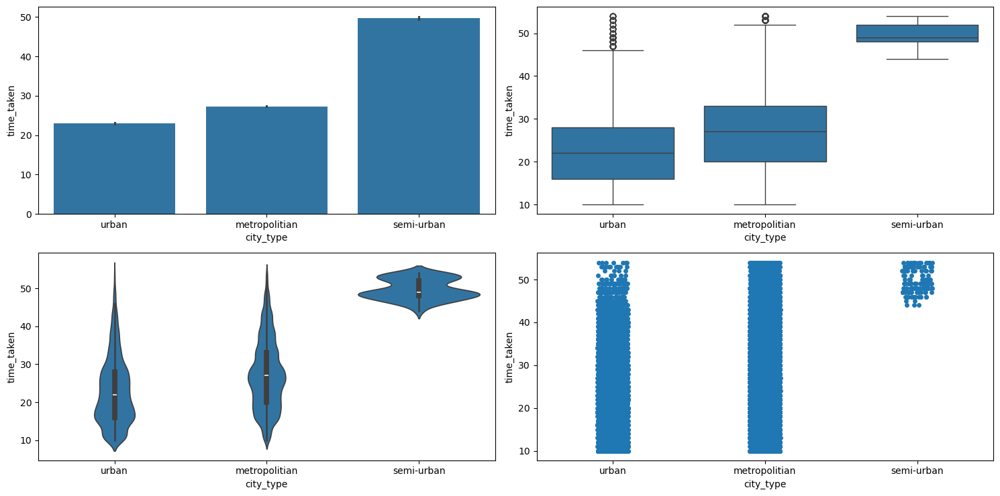

In [126]:
categorical_numerical_analysis(data=df, cat_col="city_type", num_col="time_taken")

* Clearly, urban cities have the lowest `time_taken`, followed by metropolitian, and then semi-urban.

In [127]:
anova_test(data=df, num_col="time_taken", cat_col="city_type")

p-value: 0.0.
Reject H0. The data indicates significant relationship between 'time_taken' and 'city_type'.


Let us now check if `city_type` affects `ratings`.

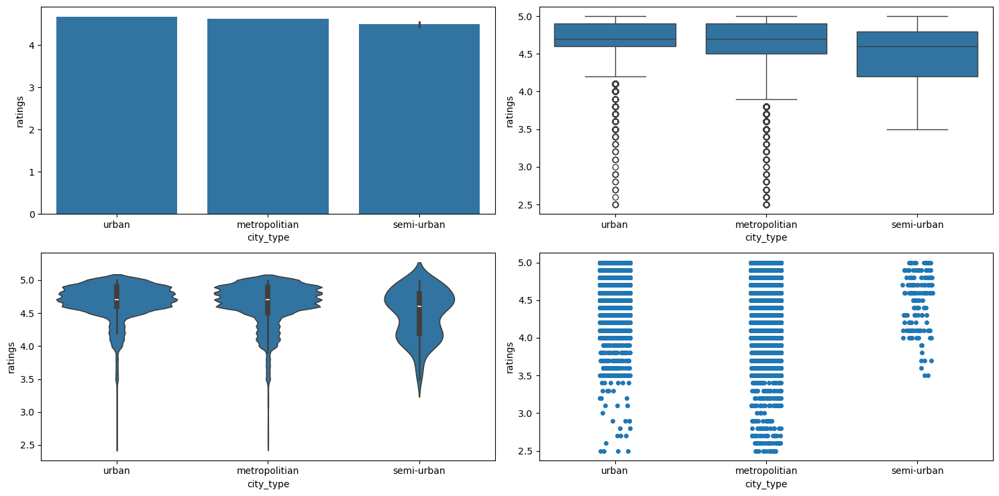

In [128]:
categorical_numerical_analysis(data=df, cat_col="city_type", num_col="ratings")

* We can see that there are no `ratings` below 3.5 in cities of semi-urban `city_type`.

Let us now see if `city_type` and `type_of_vehicle` have any effect on the target `time_taken`.

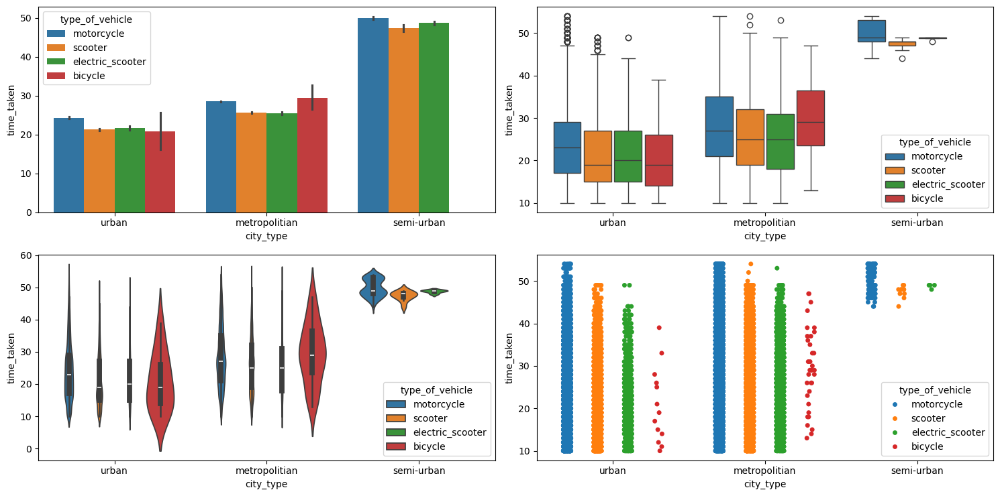

In [129]:
multivariate_analysis(data=df, num_col="time_taken", cat_col_1="city_type", cat_col_2="type_of_vehicle")

* We can see that bicycles are not used in the cities with `city_type` as semi-urban.

### `distance`

In [130]:
df["distance"].dtype

dtype('float64')

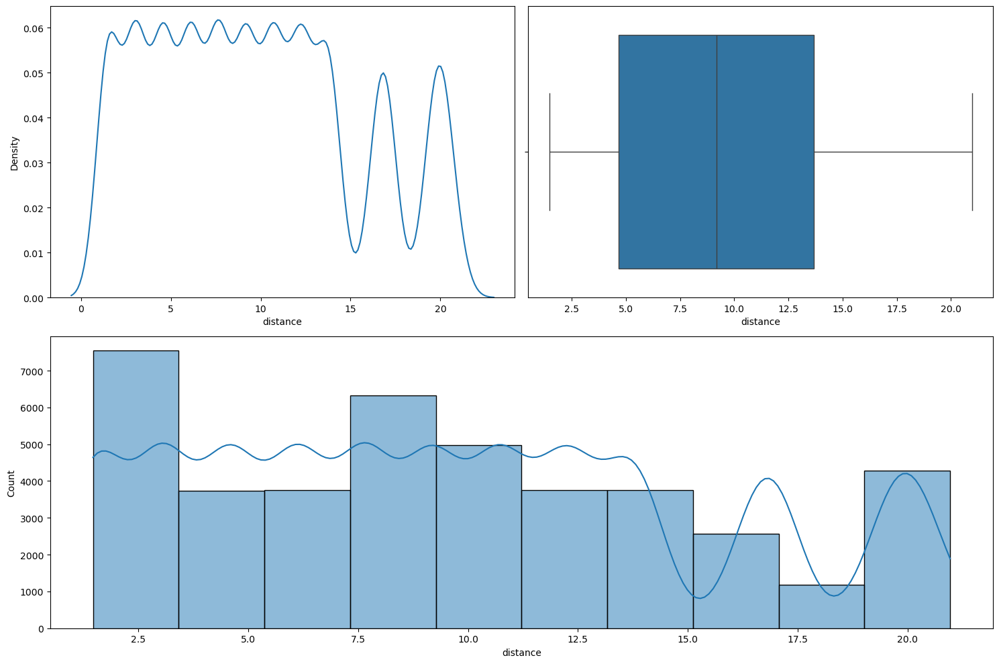

In [131]:
numerical_analysis(data=df, col_name="distance", bins=10)

Let is check if there is any effect of `distance` on `time_taken`.

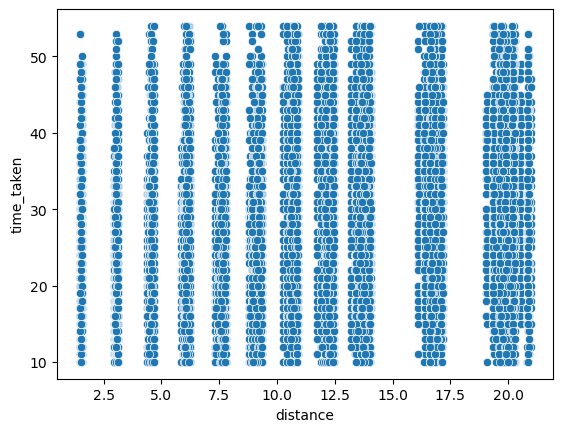

In [132]:
sns.scatterplot(df, x="distance", y="time_taken")
plt.show()

In [133]:
df[["distance", "time_taken"]].corr()

,distance,time_taken
distance,1.000000,0.320705
time_taken,0.320705,1.000000


Let us see if there is any relationship between `type_of_vehicle` and `distance`.

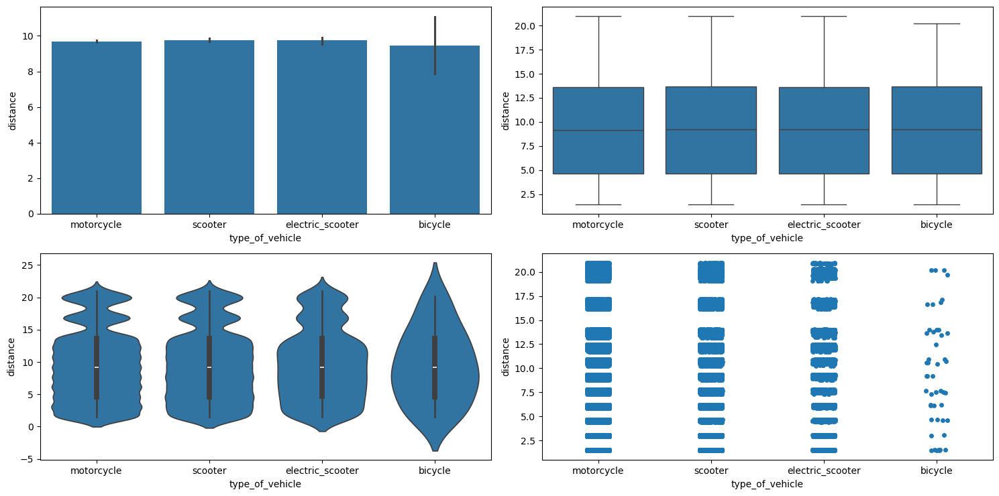

In [134]:
categorical_numerical_analysis(data=df, cat_col="type_of_vehicle", num_col="distance")

* There doesn't seem to be any relation.

Let us check if there is any relation between `distance` and `festival`.

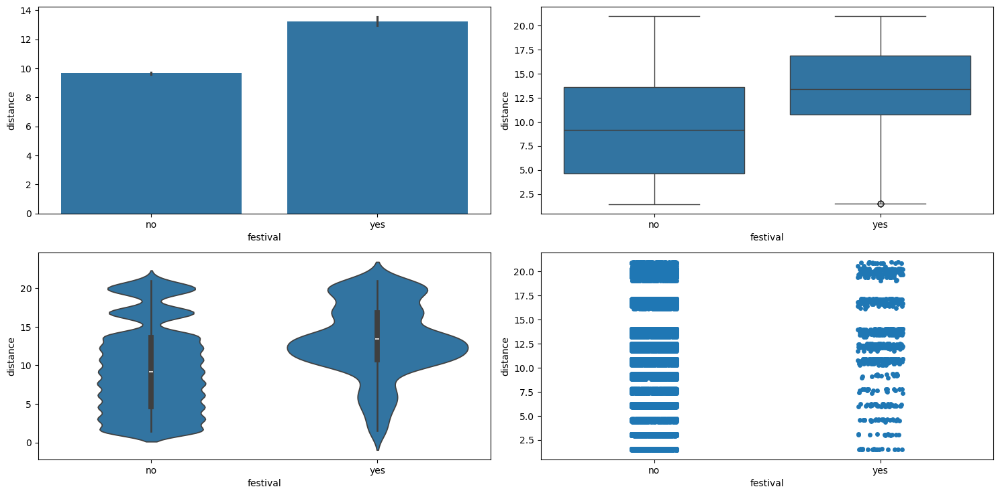

In [135]:
categorical_numerical_analysis(data=df, cat_col="festival", num_col="distance")

* We can see that riders cover a larger distance during festivals.

Let us check if there is any relation between `type_of_vehicle` and `distance`.

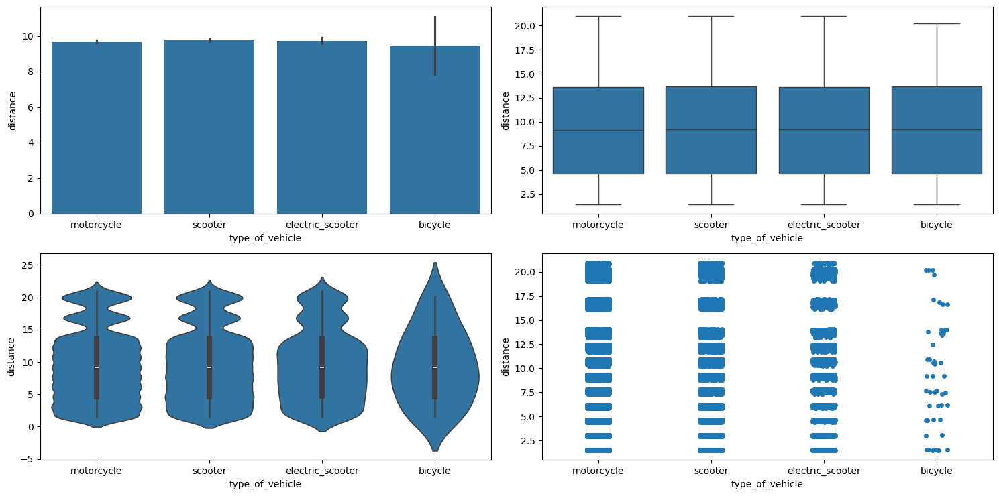

In [136]:
categorical_numerical_analysis(data=df, cat_col="type_of_vehicle", num_col="distance")

* There doesn't seem to be any relation.